In [1]:
# Import necessary libraries
import json
import logging
from pathlib import Path
import pandas as pd
from tqdm.notebook import tqdm
import ijson

# Set up logging for notebook environment
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s'
)
logger = logging.getLogger('comp_proc_loader')

def load_json_file(file_path):
    """
    Load a JSON file into a list of dictionaries, handling streaming for large files.
    
    Args:
        file_path: Path to the JSON file
        
    Returns:
        List of dictionaries from the JSON file
    """
    try:
        items = []
        with open(file_path, 'rb') as f:
            # Use ijson for streaming large JSON files
            parser = ijson.items(f, 'item')
            for item in parser:
                items.append(item)
        return items
    except Exception as e:
        logger.error(f"Error loading {file_path}: {e}")
        return []

def find_json_files(directory):
    """
    Recursively find all JSON files in a directory.
    
    Args:
        directory: Path to the directory to search
        
    Returns:
        List of Path objects for JSON files
    """
    return list(Path(directory).rglob("*.json"))

def load_comp_proc_data(base_dir="data/comp-proc", periods=None, sample_size=None):
    """
    Load all JSON files from the comp-proc dataset into a DataFrame.
    
    Args:
        base_dir: Base directory of the comp-proc dataset
        periods: List of periods to load (e.g., ["pre", "post"]). If None, load all.
        sample_size: Number of records to sample from each file. If None, load all.
        
    Returns:
        pandas DataFrame with all data
    """
    base_path = Path(base_dir)
    
    if not base_path.exists():
        logger.error(f"Directory not found: {base_path}")
        return pd.DataFrame()
    
    # If periods not specified, use all subdirectories
    if periods is None:
        periods = [p.name for p in base_path.iterdir() if p.is_dir()]
    
    all_data = []
    total_files = 0
    
    # Count total files for progress tracking
    for period in periods:
        period_path = base_path / period
        if period_path.is_dir():
            json_files = find_json_files(period_path)
            total_files += len(json_files)
    
    # Display progress with notebook-friendly tqdm
    with tqdm(total=total_files, desc="Loading JSON files") as pbar:
        for period in periods:
            period_path = base_path / period
            if not period_path.is_dir():
                logger.warning(f"Period directory not found: {period_path}")
                continue
            
            logger.info(f"Processing period: {period}")
            json_files = find_json_files(period_path)
            
            for file_path in json_files:
                logger.info(f"Loading file: {file_path}")
                items = load_json_file(file_path)
                
                # Add period and filename metadata
                for item in items:
                    item['period'] = period
                    item['source_file'] = str(file_path.relative_to(base_path))
                
                # Sample if needed
                if sample_size is not None and len(items) > sample_size:
                    items = items[:sample_size]
                
                all_data.extend(items)
                pbar.update(1)
    
    # Convert to DataFrame
    logger.info(f"Converting {len(all_data)} items to DataFrame")
    df = pd.DataFrame(all_data)
    
    # Display dataset info
    logger.info(f"Final DataFrame shape: {df.shape}")
    logger.info(f"DataFrame columns: {df.columns.tolist()}")
    
    return df

# Example usage in a notebook cell
BASE_DIR = "../data/comp-proc"
df = load_comp_proc_data(BASE_DIR)

# Display information about the dataset
display(df.head())
print(f"Dataset shape: {df.shape}")
print(f"Column names: {df.columns.tolist()}")

Loading JSON files:   0%|          | 0/50 [00:00<?, ?it/s]

2025-05-10 14:27:59,202 - INFO - Processing period: post
2025-05-10 14:27:59,203 - INFO - Loading file: ../data/comp-proc/post/2023/NOVEMBER_comp_2023.json
2025-05-10 14:27:59,497 - INFO - Loading file: ../data/comp-proc/post/2023/FEBRUARY_comp_2023.json
2025-05-10 14:27:59,814 - INFO - Loading file: ../data/comp-proc/post/2023/OCTOBER_comp_2023.json
2025-05-10 14:28:00,176 - INFO - Loading file: ../data/comp-proc/post/2023/MAY_comp_2023.json
2025-05-10 14:28:00,464 - INFO - Loading file: ../data/comp-proc/post/2023/JUNE_comp_2023.json
2025-05-10 14:28:00,775 - INFO - Loading file: ../data/comp-proc/post/2023/DECEMBER_comp_2023.json
2025-05-10 14:28:01,229 - INFO - Loading file: ../data/comp-proc/post/2023/AUGUST_comp_2023.json
2025-05-10 14:28:01,522 - INFO - Loading file: ../data/comp-proc/post/2023/MARCH_comp_2023.json
2025-05-10 14:28:01,833 - INFO - Loading file: ../data/comp-proc/post/2023/APRIL_comp_2023.json
2025-05-10 14:28:02,293 - INFO - Loading file: ../data/comp-proc/post/

,Scopus_ID,Title,Abstract,Authors,Affiliation_Name,Affiliation_Country,Publication_Date,DOI,Keywords,Cited_By_Count,Source,Citations,Binoculars_Score,Accuracy_Prediction,FPR_Prediction,period,source_file
0,85184748559,A DOCTOR RECOMMENDATION AND BREAST CANCER PRED...,"Today, people are exposed to various diseases ...","[Rethinakumar, Ganapathy G., Kang J.-J.]",N/A,India,2023-11-30,N/A,N/A,1,Journal of Theoretical and Applied Information...,"[{'Citing_Article_Scopus_ID': '85184755070', '...",0.8366336822509766,1.0,1.0,post,post/2023/NOVEMBER_comp_2023.json
1,85182796200,Preface,N/A,[],N/A,N/A,2023-11-30,N/A,N/A,0,ACM International Conference Proceeding Series,[],NaN,NaN,NaN,post,post/2023/NOVEMBER_comp_2023.json
2,85182789513,Proceedings of 2023 5th International Conferen...,The proceedings contain 14 papers. The topics ...,[],N/A,N/A,2023-11-30,N/A,N/A,0,ACM International Conference Proceeding Series,[],1.1048387289047241,0.0,0.0,post,post/2023/NOVEMBER_comp_2023.json
3,85182746242,RITA: Boost Driving Simulators with Realistic ...,High-quality traffic flow generation is the co...,"[Zhu Z., Zhang S., Zhuang Y., Liu Y., Liu M., ...",N/A,Hong Kong,2023-11-30,10.1145/3627676.3627681,N/A,0,ACM International Conference Proceeding Series,[],1.0393258333206177,0.0,0.0,post,post/2023/NOVEMBER_comp_2023.json
4,85182745664,SACAT: Student-Adaptive Computerized Adaptive ...,Computerized Adaptive Testing refers to an onl...,"[Yu J., Zhenyu M., Lei J., Yin L., Xia W., Yu ...",N/A,China,2023-11-30,10.1145/3627676.3627679,N/A,1,ACM International Conference Proceeding Series,"[{'Citing_Article_Scopus_ID': '85203816071', '...",0.9754601120948792,0.0,0.0,post,post/2023/NOVEMBER_comp_2023.json


Dataset shape: (248987, 17)
Column names: ['Scopus_ID', 'Title', 'Abstract', 'Authors', 'Affiliation_Name', 'Affiliation_Country', 'Publication_Date', 'DOI', 'Keywords', 'Cited_By_Count', 'Source', 'Citations', 'Binoculars_Score', 'Accuracy_Prediction', 'FPR_Prediction', 'period', 'source_file']


In [2]:
def std_country(df):
    country_corrections = {
        'Türkiye': 'Turkey',
        'Viet Nam': 'Vietnam',
        'Libyan Arab Jamahiriya': 'Libya',
        "Cote d'Ivoire": 'Ivory Coast'
    }
    df['Affiliation_Country'] = df['Affiliation_Country'].replace(country_corrections)
    return df
std_country(df)

,Scopus_ID,Title,Abstract,Authors,Affiliation_Name,Affiliation_Country,Publication_Date,DOI,Keywords,Cited_By_Count,Source,Citations,Binoculars_Score,Accuracy_Prediction,FPR_Prediction,period,source_file
0,85184748559,A DOCTOR RECOMMENDATION AND BREAST CANCER PRED...,"Today, people are exposed to various diseases ...","[Rethinakumar, Ganapathy G., Kang J.-J.]",N/A,India,2023-11-30,N/A,N/A,1,Journal of Theoretical and Applied Information...,"[{'Citing_Article_Scopus_ID': '85184755070', '...",0.8366336822509766,1.0,1.0,post,post/2023/NOVEMBER_comp_2023.json
1,85182796200,Preface,N/A,[],N/A,N/A,2023-11-30,N/A,N/A,0,ACM International Conference Proceeding Series,[],NaN,NaN,NaN,post,post/2023/NOVEMBER_comp_2023.json
2,85182789513,Proceedings of 2023 5th International Conferen...,The proceedings contain 14 papers. The topics ...,[],N/A,N/A,2023-11-30,N/A,N/A,0,ACM International Conference Proceeding Series,[],1.1048387289047241,0.0,0.0,post,post/2023/NOVEMBER_comp_2023.json
3,85182746242,RITA: Boost Driving Simulators with Realistic ...,High-quality traffic flow generation is the co...,"[Zhu Z., Zhang S., Zhuang Y., Liu Y., Liu M., ...",N/A,Hong Kong,2023-11-30,10.1145/3627676.3627681,N/A,0,ACM International Conference Proceeding Series,[],1.0393258333206177,0.0,0.0,post,post/2023/NOVEMBER_comp_2023.json
4,85182745664,SACAT: Student-Adaptive Computerized Adaptive ...,Computerized Adaptive Testing refers to an onl...,"[Yu J., Zhenyu M., Lei J., Yin L., Xia W., Yu ...",N/A,China,2023-11-30,10.1145/3627676.3627679,N/A,1,ACM International Conference Proceeding Series,"[{'Citing_Article_Scopus_ID': '85203816071', '...",0.9754601120948792,0.0,0.0,post,post/2023/NOVEMBER_comp_2023.json
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248982,85141495076,Vertical Coupling Mechanism between the Sittin...,In order to explore the coupling effect betwee...,"[Yu Y., Zhao L., Zhou C.]",N/A,China,2022-08-01,10.3901/JME.2022.16.290,N/A,1,Jixie Gongcheng Xuebao/Journal of Mechanical E...,"[{'Citing_Article_Scopus_ID': '85219007656', '...",0.8888888955116272,1.0,0.0,pre,pre/2022/AUGUST_comp_2022.json
248983,85141489821,UniTire Model and Vehicle Stability Analysis C...,"Under extreme conditions, the impact of tire m...","[Xu N., Zhang Z., Yang Y., Xu J.]",N/A,China,2022-08-01,10.3901/JME.2022.16.247,N/A,3,Jixie Gongcheng Xuebao/Journal of Mechanical E...,"[{'Citing_Article_Scopus_ID': '85217686525', '...",0.9435897469520569,0.0,0.0,pre,pre/2022/AUGUST_comp_2022.json
248984,85141489680,Comparative Studies of Surrogate Models Based ...,The surrogate model refers to the use of limit...,"[He X., Yang L., Ran R., Zhu F., Song X.]",N/A,China,2022-08-01,10.3901/JME.2022.16.403,N/A,12,Jixie Gongcheng Xuebao/Journal of Mechanical E...,"[{'Citing_Article_Scopus_ID': '85215764925', '...",1.0166666507720947,0.0,0.0,pre,pre/2022/AUGUST_comp_2022.json
248985,85141488842,Phased Fusion Method of Degradation and Lifeti...,The degradation data and lifetime data of prod...,"[Li B., Jia X., Zhao Q., Guo B.]",N/A,China,2022-08-01,10.3901/JME.2022.16.430,N/A,1,Jixie Gongcheng Xuebao/Journal of Mechanical E...,"[{'Citing_Article_Scopus_ID': '85212590056', '...",1.0789474248886108,0.0,0.0,pre,pre/2022/AUGUST_comp_2022.json


In [3]:
# Convert to datetime if it's not already
df['Publication_Date'] = pd.to_datetime(df['Publication_Date'])

In [4]:
def print_unique_countries(df):
    unique_countries = df['Affiliation_Country'].dropna().unique()
    print("Unique countries:")
    for country in sorted(unique_countries):
        print(country)
print_unique_countries(df)

Unique countries:
Afghanistan
Albania
Algeria
Angola
Anguilla
Argentina
Armenia
Australia
Austria
Azerbaijan
Bahrain
Bangladesh
Belarus
Belgium
Belize
Benin
Bhutan
Bolivia
Bosnia and Herzegovina
Botswana
Brazil
Brunei Darussalam
Bulgaria
Burkina Faso
Cambodia
Cameroon
Canada
Chile
China
Colombia
Costa Rica
Croatia
Cuba
Cyprus
Czech Republic
Democratic Republic Congo
Denmark
Dominican Republic
Ecuador
Egypt
El Salvador
Eritrea
Estonia
Ethiopia
European Union
Faroe Islands
Fiji
Finland
France
French Polynesia
Georgia
Germany
Ghana
Gibraltar
Greece
Guam
Guatemala
Guinea
Honduras
Hong Kong
Hungary
Iceland
India
Indonesia
Iran
Iraq
Ireland
Israel
Italy
Ivory Coast
Jamaica
Japan
Jordan
Kazakhstan
Kenya
Kuwait
Kyrgyzstan
Laos
Latvia
Lebanon
Lesotho
Liberia
Libya
Liechtenstein
Lithuania
Luxembourg
Macao
Madagascar
Malawi
Malaysia
Maldives
Mali
Malta
Mauritania
Mauritius
Mexico
Moldova
Mongolia
Montenegro
Morocco
Mozambique
Myanmar
N/A
Namibia
Nepal
Netherlands
New Caledonia
New Zealand
Nicarag

In [5]:
# Global East countries - Developing nations, including Latin America and Africa
global_east = {
    # East Asia
    'China', 'Japan', 'South Korea', 'North Korea', 'Mongolia', 'Taiwan',
    'Hong Kong', 'Macao',
    
    # Southeast Asia
    'Vietnam', 'Viet Nam', 'Cambodia', 'Laos', 'Myanmar', 'Thailand',
    'Malaysia', 'Singapore', 'Indonesia', 'Philippines', 'Brunei Darussalam',
    'Timor-Leste',
    
    # South Asia
    'Afghanistan',  # Added as per specification
    'India', 'Pakistan', 'Bangladesh', 'Sri Lanka', 'Nepal', 'Bhutan',
    'Maldives',
    
    # Central Asia
    'Kazakhstan', 'Kyrgyzstan', 'Tajikistan', 'Turkmenistan', 'Uzbekistan',
    
    # Middle East (except Israel)
    'Iran', 'Iraq', 'Syria', 'Syrian Arab Republic', 'Lebanon', 'Jordan',
    'Saudi Arabia', 'Kuwait', 'Bahrain', 'Qatar', 'United Arab Emirates',
    'Oman', 'Yemen', 'Turkey', 'Türkiye', 'Palestine',
    
    # Eastern Europe (non-EU) and Russia
    'Russian Federation', 'Ukraine', 'Belarus', 'Moldova',
    'Azerbaijan', 'Armenia', 'Georgia',
    
    # Latin America and Caribbean (as per specification)
    'Anguilla',  # Added as per specification
    'Mexico', 'Guatemala', 'Honduras', 'El Salvador', 'Nicaragua', 'Costa Rica',
    'Panama', 'Cuba', 'Dominican Republic', 'Puerto Rico', 'Jamaica',
    'Trinidad and Tobago', 'Brazil', 'Argentina', 'Chile', 'Colombia', 'Peru',
    'Venezuela', 'Ecuador', 'Bolivia', 'Paraguay', 'Uruguay', 'Guyana',
    'French Polynesia', 'Belize',
    
    # Africa (as per specification)
    'Morocco', 'Algeria', 'Tunisia', 'Libya', 'Libyan Arab Jamahiriya', 'Egypt',
    'Sudan', 'South Sudan', 'Ethiopia', 'Eritrea', 'Somalia', 'Djibouti',
    'Kenya', 'Uganda', 'Tanzania', 'Rwanda', 'Burundi', 'Democratic Republic Congo',
    'Congo', 'Cameroon', 'Nigeria', 'Ghana', 'Ivory Coast', 'Cote d\'Ivoire',
    'Liberia', 'Sierra Leone', 'Guinea', 'Mali', 'Burkina Faso', 'Niger',
    'Chad', 'Senegal', 'Gambia', 'Mauritania', 'Benin', 'Togo',
    'South Africa', 'Namibia', 'Botswana', 'Zimbabwe', 'Zambia', 'Malawi',
    'Mozambique', 'Madagascar', 'Angola', 'Lesotho', 'Swaziland', 'Seychelles',
    'Mauritius',
    
    # Pacific Islands
    'Papua New Guinea', 'Solomon Islands', 'Fiji', 'Tonga', 'New Caledonia', 'Guam'
}

In [6]:
# Create region variable
df['region'] = df['Affiliation_Country'].apply(lambda x: 'East' if x in global_east else 'West')
df['east'] = (df['region'] == 'East').astype(int)  # 1 for East, 0 for West

In [7]:
def process_citations(df, global_east):
    # Standardization map
    country_corrections = {
        'Türkiye': 'Turkey',
        'Viet Nam': 'Vietnam',
        'Libyan Arab Jamahiriya': 'Libya',
        "Cote d'Ivoire": 'Ivory Coast'
    }

    # Helper to standardize country names
    def std_country_name(name):
        return country_corrections.get(name, name)

    # Helper to assign region
    def assign_region(country):
        return 'East' if country in global_east else 'West'

    # Initialize new columns
    df['cite_same_c'] = 0
    df['cite_diff_c'] = 0
    df['cite_same_r'] = 0
    df['cite_diff_r'] = 0

    for idx, row in df.iterrows():
        home_country = std_country_name(row['Affiliation_Country'])
        home_region = assign_region(home_country)

        same_c, diff_c, same_r, diff_r = 0, 0, 0, 0
        citations = row['Citations']

        if isinstance(citations, list):
            for citation in citations:
                # Standardize citing country
                citing_country = std_country_name(citation.get('Citing_Affiliation_Country'))
                citation['Citing_Affiliation_Country'] = citing_country

                # Assign region
                citing_region = assign_region(citing_country)
                citation['region'] = citing_region
                citation['east'] = 1 if citing_region == 'East' else 0

                # Compare country
                if citing_country == home_country:
                    same_c += 1
                else:
                    diff_c += 1

                # Compare region
                if citing_region == home_region:
                    same_r += 1
                else:
                    diff_r += 1

        # Update counts
        df.at[idx, 'cite_same_c'] = same_c
        df.at[idx, 'cite_diff_c'] = diff_c
        df.at[idx, 'cite_same_r'] = same_r
        df.at[idx, 'cite_diff_r'] = diff_r

    return df
df = process_citations(df, global_east)


In [8]:
# Define cutoff date for ChatGPT release (November 23, 2022)
cutoff_date = pd.Timestamp('2022-11-23')

# Create RDD variables
df['days_from_cutoff'] = (df['Publication_Date'] - cutoff_date).dt.days 

In [9]:
print(f"Column names: {df.columns.tolist()}")

Column names: ['Scopus_ID', 'Title', 'Abstract', 'Authors', 'Affiliation_Name', 'Affiliation_Country', 'Publication_Date', 'DOI', 'Keywords', 'Cited_By_Count', 'Source', 'Citations', 'Binoculars_Score', 'Accuracy_Prediction', 'FPR_Prediction', 'period', 'source_file', 'region', 'east', 'cite_same_c', 'cite_diff_c', 'cite_same_r', 'cite_diff_r', 'days_from_cutoff']


In [10]:
df['post_chatgpt'] = (df['period'] == 'post').astype(int)

## Add Journal Ranking Information
Use the ```scimagojr 2024.csv``` file.


In [11]:
df2 = pd.read_csv("scimagojr 2024.csv", sep=";")

## Columns of Interest
from df2, we need to extract the following values:
['Rank', 'Title', 'Type', 'SJR', 'SJR Best Quartile', 'H index', 'Country', 'Region', 'Areas']

For each unique entry in df, check the Source column and see if it is equal to Title column in df2, and if so, add the columns of interest to df1.

Additionally, since one unique 'Country' can map to one unique 'Region', extract a dataset covering all Countries in specific regions. Then we can apply that to the 'Affiliation_Country' column, and add a 'region_c' value to it, as the existing 'region' variable only covers Global East and Global West broadly.

In [12]:
# Standardize both columns (lowercase + strip whitespace)
df2['Title_clean'] = df2['Title'].str.strip().str.lower()
df['Source_clean'] = df['Source'].str.strip().str.lower()

# Check for matches
matching_titles = df['Source_clean'].isin(df2['Title_clean'])

# Print how many matches found
print(f"Matching entries found: {matching_titles.sum()} out of {len(df2)}")

Matching entries found: 159136 out of 31136


In [13]:
# Merge using cleaned columns for better matching
df = df.merge(
    df2[['Rank', 'Title_clean', 'Type', 'SJR', 'SJR Best Quartile', 'H index', 'Country', 'Region', 'Areas', 'Categories']],
    left_on='Source_clean', right_on='Title_clean', how='left'
)
df.head()

,Scopus_ID,Title,Abstract,Authors,Affiliation_Name,Affiliation_Country,Publication_Date,DOI,Keywords,Cited_By_Count,...,Rank,Title_clean,Type,SJR,SJR Best Quartile,H index,Country,Region,Areas,Categories
0,85184748559,A DOCTOR RECOMMENDATION AND BREAST CANCER PRED...,"Today, people are exposed to various diseases ...","[Rethinakumar, Ganapathy G., Kang J.-J.]",N/A,India,2023-11-30,N/A,N/A,1,...,23230.0,journal of theoretical and applied information...,journal,"0,168",Q4,42.0,Pakistan,Asiatic Region,Computer Science; Mathematics,Computer Science (miscellaneous) (Q4); Theoret...
1,85182796200,Preface,N/A,[],N/A,N/A,2023-11-30,N/A,N/A,0,...,21708.0,acm international conference proceeding series,conference and proceedings,"0,191",-,164.0,United States,Northern America,Computer Science,Artificial Intelligence; Computer Networks and...
2,85182789513,Proceedings of 2023 5th International Conferen...,The proceedings contain 14 papers. The topics ...,[],N/A,N/A,2023-11-30,N/A,N/A,0,...,21708.0,acm international conference proceeding series,conference and proceedings,"0,191",-,164.0,United States,Northern America,Computer Science,Artificial Intelligence; Computer Networks and...
3,85182746242,RITA: Boost Driving Simulators with Realistic ...,High-quality traffic flow generation is the co...,"[Zhu Z., Zhang S., Zhuang Y., Liu Y., Liu M., ...",N/A,Hong Kong,2023-11-30,10.1145/3627676.3627681,N/A,0,...,21708.0,acm international conference proceeding series,conference and proceedings,"0,191",-,164.0,United States,Northern America,Computer Science,Artificial Intelligence; Computer Networks and...
4,85182745664,SACAT: Student-Adaptive Computerized Adaptive ...,Computerized Adaptive Testing refers to an onl...,"[Yu J., Zhenyu M., Lei J., Yin L., Xia W., Yu ...",N/A,China,2023-11-30,10.1145/3627676.3627679,N/A,1,...,21708.0,acm international conference proceeding series,conference and proceedings,"0,191",-,164.0,United States,Northern America,Computer Science,Artificial Intelligence; Computer Networks and...


In [14]:
df.columns.values.tolist()

['Scopus_ID',
 'Title',
 'Abstract',
 'Authors',
 'Affiliation_Name',
 'Affiliation_Country',
 'Publication_Date',
 'DOI',
 'Keywords',
 'Cited_By_Count',
 'Source',
 'Citations',
 'Binoculars_Score',
 'Accuracy_Prediction',
 'FPR_Prediction',
 'period',
 'source_file',
 'region',
 'east',
 'cite_same_c',
 'cite_diff_c',
 'cite_same_r',
 'cite_diff_r',
 'days_from_cutoff',
 'post_chatgpt',
 'Source_clean',
 'Rank',
 'Title_clean',
 'Type',
 'SJR',
 'SJR Best Quartile',
 'H index',
 'Country',
 'Region',
 'Areas',
 'Categories']

In [15]:
df.drop(['Source','Title_clean'], axis=1, inplace=True)

df.rename(columns={
    'east':'from_east', # drop 'Title_clean' and 'Source'
    'Country': 'Publication_Country', # make a variable for publication region
    'cite_same_c': 'Cite_Same_Country',
    'cite_diff_c': 'Cite_Diff_Country',
    'cite_same_r': 'Cite_Same_Region_H',
    'cite_diff_r': 'Cite_Diff_Region_H',
    'Region': 'Pub_Region',
    'region': 'Auth_Region_H', # H, hemisphere = East/West(?) maybe find better labels
}, inplace=True)

In [16]:
df.columns.values.tolist()

['Scopus_ID',
 'Title',
 'Abstract',
 'Authors',
 'Affiliation_Name',
 'Affiliation_Country',
 'Publication_Date',
 'DOI',
 'Keywords',
 'Cited_By_Count',
 'Citations',
 'Binoculars_Score',
 'Accuracy_Prediction',
 'FPR_Prediction',
 'period',
 'source_file',
 'Auth_Region_H',
 'from_east',
 'Cite_Same_Country',
 'Cite_Diff_Country',
 'Cite_Same_Region_H',
 'Cite_Diff_Region_H',
 'days_from_cutoff',
 'post_chatgpt',
 'Source_clean',
 'Rank',
 'Type',
 'SJR',
 'SJR Best Quartile',
 'H index',
 'Publication_Country',
 'Pub_Region',
 'Areas',
 'Categories']

## New Region Mapping
First, we load a list of unique 'Citing_Affiliation_Country' values. As per data structure in the column ```df['Citations']```, this is structured as
```['Citing_Article_URL', 'Citing_Article_Scopus_ID', 'Cited_Date', 'Citing_Affiliation_Country', 'Citing_Citation_Count']```.

Then, we load another list, which has all of the unique ```df2['Publication_Country']``` values.

Then, check whether there are entries that don't have matching names in the other list.



In [17]:
# Extract unique citing countries from 'Citations' field in df (assuming citation is a dict)
citing_countries = set()
for citations in df['Citations'].dropna():
    for citation in citations:
        if isinstance(citation, dict):
            country = citation.get('Citing_Affiliation_Country')
            if pd.notnull(country):
                citing_countries.add(country.strip())

# Extract unique countries from df['Publication_Country']
publication_countries = set(df['Publication_Country'].dropna().str.strip())

print("Countries in Publication data:")
print(sorted(publication_countries))

# Find differences
in_citing_not_publication = citing_countries - publication_countries
in_publication_not_citing = publication_countries - citing_countries

# Display mismatches
print("Countries in citing data but not in publication data:")
print(sorted(in_citing_not_publication))

print("\nCountries in publication data but not in citing data:")
print(sorted(in_publication_not_citing))


Countries in Publication data:
['Argentina', 'Australia', 'Austria', 'Bahrain', 'Bangladesh', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Brazil', 'Bulgaria', 'Canada', 'Chile', 'China', 'Colombia', 'Costa Rica', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Ecuador', 'Egypt', 'Finland', 'France', 'Germany', 'Greece', 'Hong Kong', 'Hungary', 'India', 'Indonesia', 'Iran', 'Iraq', 'Italy', 'Japan', 'Jordan', 'Kazakhstan', 'Latvia', 'Lithuania', 'Malaysia', 'Moldova', 'Netherlands', 'Norway', 'Pakistan', 'Poland', 'Portugal', 'Romania', 'Russian Federation', 'Serbia', 'Singapore', 'Slovakia', 'Slovenia', 'South Africa', 'South Korea', 'Spain', 'Sweden', 'Switzerland', 'Taiwan', 'Thailand', 'Turkey', 'Ukraine', 'United Arab Emirates', 'United Kingdom', 'United States']
Countries in citing data but not in publication data:
['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Anguilla', 'Antigua and Barbuda', 'Armenia', 'Aruba', 'Azerbaijan', 'Benin', 'Bhutan', 'Bolivia', 'Botswana', '

None seem to have misspelling issues for exclusion.
Now lets look at unique df['Pub_Region'] values.


In [18]:
print(sorted(df2['Region'].dropna().unique()))
# For each region, print associated unique countries
for region in sorted(df2['Region'].dropna().unique()):
    countries = sorted(df2.loc[df2['Region'] == region, 'Country'].dropna().unique())
    print(f"\nRegion: {region}")
    print(countries)



['Africa', 'Africa/Middle East', 'Asiatic Region', 'Eastern Europe', 'Latin America', 'Middle East', 'Northern America', 'Pacific Region', 'Western Europe']

Region: Africa
['Algeria', 'Cameroon', 'Ethiopia', 'Ghana', 'Kenya', 'Libya', 'Malawi', 'Mali', 'Mauritius', 'Morocco', 'Nigeria', 'Rwanda', 'Senegal', 'South Africa', 'Sudan', 'Tanzania', 'Tunisia', 'Uganda', 'Zimbabwe']

Region: Africa/Middle East
['Egypt']

Region: Asiatic Region
['Bangladesh', 'Bhutan', 'Brunei Darussalam', 'China', 'Hong Kong', 'India', 'Indonesia', 'Japan', 'Kazakhstan', 'Kyrgyzstan', 'Malaysia', 'Mongolia', 'Nepal', 'Pakistan', 'Philippines', 'Singapore', 'South Korea', 'Sri Lanka', 'Taiwan', 'Tajikistan', 'Thailand', 'Uzbekistan', 'Viet Nam']

Region: Eastern Europe
['Albania', 'Armenia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czech Republic', 'Estonia', 'Georgia', 'Hungary', 'Latvia', 'Lithuania', 'Macedonia', 'Moldova', 'Montenegro', 'Poland', 'Romania', 'Russian Feder

In [19]:
# Build region-country mapping dictionary from df2
region_country_map = {}
for region in sorted(df2['Region'].dropna().unique()):
    countries = sorted(df2.loc[df2['Region'] == region, 'Country'].dropna().unique())
    region_country_map[region] = set(countries)


In [20]:
# Flatten region-country map into a country-to-region dictionary
country_to_region_map = {}
for region, countries in region_country_map.items():
    for country in countries:
        country_to_region_map[country] = region


In [21]:
# Identify countries in df['Affiliation_Country'] without a mapped region
unmapped_countries = set(df['Affiliation_Country'].dropna().str.strip()) - set(country_to_region_map.keys())

print("Countries without region mapping:")
print(sorted(unmapped_countries))


Countries without region mapping:
['Afghanistan', 'Angola', 'Anguilla', 'Belize', 'Benin', 'Botswana', 'Burkina Faso', 'Cambodia', 'Democratic Republic Congo', 'Dominican Republic', 'El Salvador', 'Eritrea', 'European Union', 'Faroe Islands', 'Fiji', 'French Polynesia', 'Gibraltar', 'Guam', 'Guatemala', 'Guinea', 'Honduras', 'Ivory Coast', 'Laos', 'Lesotho', 'Liberia', 'Liechtenstein', 'Macao', 'Madagascar', 'Maldives', 'Mauritania', 'Mozambique', 'Myanmar', 'N/A', 'Namibia', 'New Caledonia', 'Nicaragua', 'Niger', 'North Korea', 'North Macedonia', 'Panama', 'Papua New Guinea', 'Seychelles', 'Solomon Islands', 'Somalia', 'Swaziland', 'Syrian Arab Republic', 'Timor-Leste', 'Togo', 'Tonga', 'Turkmenistan', 'Vatican City State', 'Vietnam', 'Yemen', 'Zambia']


In [22]:
# Fix known name variant
if 'Viet Nam' in country_to_region_map:
    country_to_region_map['Vietnam'] = country_to_region_map.pop('Viet Nam')


In [23]:
# Manual region assignments for unmapped countries
manual_assignments = {
    'Afghanistan': 'Asiatic Region',
    'Angola': 'Africa',
    'Anguilla': 'Latin America',
    'Belize': 'Latin America',
    'Benin': 'Africa',
    'Botswana': 'Africa',
    'Burkina Faso': 'Africa',
    'Cambodia': 'Asiatic Region',
    'Democratic Republic Congo': 'Africa',
    'Dominican Republic': 'Latin America',
    'El Salvador': 'Latin America',
    'Eritrea': 'Africa',
    'European Union': 'Western Europe',
    'Faroe Islands': 'Western Europe',
    'Fiji': 'Pacific Region',
    'French Polynesia': 'Pacific Region',
    'Gibraltar': 'Western Europe',
    'Guam': 'Pacific Region',
    'Guatemala': 'Latin America',
    'Guinea': 'Africa',
    'Honduras': 'Latin America',
    'Ivory Coast': 'Africa',
    'Laos': 'Asiatic Region',
    'Lesotho': 'Africa',
    'Liberia': 'Africa',
    'Liechtenstein': 'Western Europe',
    'Macao': 'Asiatic Region',
    'Madagascar': 'Africa',
    'Maldives': 'Asiatic Region',
    'Mauritania': 'Africa',
    'Mozambique': 'Africa',
    'Myanmar': 'Asiatic Region',
    'N/A': None,
    'Namibia': 'Africa',
    'New Caledonia': 'Pacific Region',
    'Nicaragua': 'Latin America',
    'Niger': 'Africa',
    'North Korea': 'Asiatic Region',
    'North Macedonia': 'Eastern Europe',
    'Panama': 'Latin America',
    'Papua New Guinea': 'Pacific Region',
    'Seychelles': 'Africa',
    'Solomon Islands': 'Pacific Region',
    'Somalia': 'Africa',
    'Swaziland': 'Africa',
    'Syrian Arab Republic': 'Middle East',
    'Timor-Leste': 'Asiatic Region',
    'Togo': 'Africa',
    'Tonga': 'Pacific Region',
    'Turkmenistan': 'Asiatic Region',
    'Vatican City State': 'Western Europe',
    'Vietnam': 'Asiatic Region',
    'Yemen': 'Middle East',
    'Zambia': 'Africa',
    'Egypt':'Middle East' # as Egypt was a singular country in Africa/Middle East category
}

# Update the map with manual assignments
country_to_region_map.update(manual_assignments)


Tasks now:

Add df['Auth_Region_C'] as a new column, and map the region according to the value in df['Affiliation_Country'] column.


Then, add column df['Citation_in_{region}'], and for each 'Citation_Affiliation_Country' in df['Citations'] (stored as a dictionary), add +1 to the corresponding region column.

In [24]:
# Add 'Auth_Region_C' based on Affiliation_Country using the country_to_region_map
df['Auth_Region_C'] = df['Affiliation_Country'].map(country_to_region_map)
# Initialize region-based citation count columns
for region in set(country_to_region_map.values()) - {None}:
    df[f'Citation_in_{region}'] = 0
# Count citations in each region based on 'Citing_Affiliation_Country'
for idx, citations in df['Citations'].dropna().items():
    for citation in citations:
        if isinstance(citation, dict):
            country = citation.get('Citing_Affiliation_Country')
            if pd.notnull(country):
                country = country.strip()
                region = country_to_region_map.get(country)
                if region:
                    df.at[idx, f'Citation_in_{region}'] += 1


In [25]:
# Initialize counters
df['Cite_Same_C'] = 0
df['Cite_Diff_C'] = 0
# Count citations from same and different regions
for idx, row in df.iterrows():
    auth_region = row['Auth_Region_C']
    same, diff = 0, 0
    citations = row['Citations']
    
    if pd.notnull(auth_region) and isinstance(citations, list):
        for citation in citations:
            if isinstance(citation, dict):
                citing_country = citation.get('Citing_Affiliation_Country')
                if pd.notnull(citing_country):
                    citing_country = citing_country.strip()
                    citing_region = country_to_region_map.get(citing_country)
                    if citing_region:
                        if citing_region == auth_region:
                            same += 1
                        else:
                            diff += 1
    df.at[idx, 'Cite_Same_C'] = same
    df.at[idx, 'Cite_Diff_C'] = diff


In [26]:
df.columns.values.tolist()

['Scopus_ID',
 'Title',
 'Abstract',
 'Authors',
 'Affiliation_Name',
 'Affiliation_Country',
 'Publication_Date',
 'DOI',
 'Keywords',
 'Cited_By_Count',
 'Citations',
 'Binoculars_Score',
 'Accuracy_Prediction',
 'FPR_Prediction',
 'period',
 'source_file',
 'Auth_Region_H',
 'from_east',
 'Cite_Same_Country',
 'Cite_Diff_Country',
 'Cite_Same_Region_H',
 'Cite_Diff_Region_H',
 'days_from_cutoff',
 'post_chatgpt',
 'Source_clean',
 'Rank',
 'Type',
 'SJR',
 'SJR Best Quartile',
 'H index',
 'Publication_Country',
 'Pub_Region',
 'Areas',
 'Categories',
 'Auth_Region_C',
 'Citation_in_Asiatic Region',
 'Citation_in_Middle East',
 'Citation_in_Eastern Europe',
 'Citation_in_Latin America',
 'Citation_in_Northern America',
 'Citation_in_Western Europe',
 'Citation_in_Africa',
 'Citation_in_Pacific Region',
 'Cite_Same_C',
 'Cite_Diff_C']

Check if df['Categories'] is stored as a dictionary

In [27]:
for entry in df['Categories'].dropna().unique()[:10]:
    print(entry)


Computer Science (miscellaneous) (Q4); Theoretical Computer Science (Q4)
Artificial Intelligence; Computer Networks and Communications; Computer Vision and Pattern Recognition; Human-Computer Interaction; Software
Information Systems and Management (Q3); Computer Science (miscellaneous) (Q4); Statistics, Probability and Uncertainty (Q4)
Computer Graphics and Computer-Aided Design (Q1)
Communication (Q2); Geography, Planning and Development (Q2); Information Systems (Q2); Public Administration (Q2); Sociology and Political Science (Q2)
Artificial Intelligence (Q4)
Computer Networks and Communications (Q2); Computer Science Applications (Q2); Hardware and Architecture (Q2); Information Systems (Q2); Software (Q2)
Artificial Intelligence (Q1); Control and Systems Engineering (Q1); Hardware and Architecture (Q1); Information Systems (Q1); Software (Q1)
Computer Science (miscellaneous) (Q2); Electrical and Electronic Engineering (Q3)
Control and Systems Engineering (Q2); Industrial and Manu

In [28]:
import re

def extract_main_category(cat_string):
    if pd.isna(cat_string):
        return None

    parts = [x.strip() for x in cat_string.split(';')]
    best_category = None
    best_quartile = None

    for part in parts:
        match = re.match(r"^(.*?)(?:\s*\((Q[1-4])\))?$", part)
        if match:
            category = match.group(1).strip()
            quartile = match.group(2)

            if not quartile:
                continue

            # Compare quartile rank: Q1 (1) is better than Q2 (2), etc.
            if best_quartile is None or int(quartile[1]) < int(best_quartile[1]):
                best_category = category
                best_quartile = quartile

    return best_category

# Apply the function
df['Category_Main'] = df['Categories'].apply(extract_main_category)


In [29]:
# Select only the columns needed for Stata
stata_df = df

In [30]:
# Check distribution by region
print("\nDistribution by region:")
print(stata_df['Auth_Region_H'].value_counts())

# Check distribution before and after ChatGPT
print("\nDistribution before and after ChatGPT:")
print(stata_df['post_chatgpt'].value_counts())


Distribution by region:
Auth_Region_H
East    150981
West     98031
Name: count, dtype: int64

Distribution before and after ChatGPT:
post_chatgpt
1    129411
0    119601
Name: count, dtype: int64


In [31]:
# Clean data - remove any rows with missing values in key columns
stata_df = stata_df.dropna(subset=['Cited_By_Count', 'Binoculars_Score', 'days_from_cutoff'])

# Export to CSV with Stata-friendly formatting
stata_df.to_csv('chatgpt_citation_analysis.csv', index=False)
print(f"Data exported to chatgpt_citation_analysis.csv with {len(stata_df)} observations")

# Print summary statistics to check the data
print("\nSummary statistics:")
print(stata_df.describe())

Data exported to chatgpt_citation_analysis.csv with 238218 observations

Summary statistics:
                    Publication_Date  Cited_By_Count  Accuracy_Prediction  \
count                         238218   238218.000000        238218.000000   
mean   2023-01-19 23:44:40.935949568        5.218451             0.063026   
min              2021-01-01 00:00:00        0.000000             0.000000   
25%              2022-01-05 00:00:00        0.000000             0.000000   
50%              2023-01-27 00:00:00        1.000000             0.000000   
75%              2024-01-15 00:00:00        5.000000             0.000000   
max              2025-03-01 00:00:00     3029.000000             1.000000   
std                              NaN       20.499822             0.243011   

       FPR_Prediction      from_east  Cite_Same_Country  Cite_Diff_Country  \
count   238218.000000  238218.000000      238218.000000      238218.000000   
mean         0.017110       0.621171           1.869477  

In [32]:
df.head()

,Scopus_ID,Title,Abstract,Authors,Affiliation_Name,Affiliation_Country,Publication_Date,DOI,Keywords,Cited_By_Count,...,Citation_in_Middle East,Citation_in_Eastern Europe,Citation_in_Latin America,Citation_in_Northern America,Citation_in_Western Europe,Citation_in_Africa,Citation_in_Pacific Region,Cite_Same_C,Cite_Diff_C,Category_Main
0,85184748559,A DOCTOR RECOMMENDATION AND BREAST CANCER PRED...,"Today, people are exposed to various diseases ...","[Rethinakumar, Ganapathy G., Kang J.-J.]",N/A,India,2023-11-30,N/A,N/A,1,...,0,0,0,0,0,0,0,1,0,Computer Science (miscellaneous)
1,85182796200,Preface,N/A,[],N/A,N/A,2023-11-30,N/A,N/A,0,...,0,0,0,0,0,0,0,0,0,None
2,85182789513,Proceedings of 2023 5th International Conferen...,The proceedings contain 14 papers. The topics ...,[],N/A,N/A,2023-11-30,N/A,N/A,0,...,0,0,0,0,0,0,0,0,0,None
3,85182746242,RITA: Boost Driving Simulators with Realistic ...,High-quality traffic flow generation is the co...,"[Zhu Z., Zhang S., Zhuang Y., Liu Y., Liu M., ...",N/A,Hong Kong,2023-11-30,10.1145/3627676.3627681,N/A,0,...,0,0,0,0,0,0,0,0,0,None
4,85182745664,SACAT: Student-Adaptive Computerized Adaptive ...,Computerized Adaptive Testing refers to an onl...,"[Yu J., Zhenyu M., Lei J., Yin L., Xia W., Yu ...",N/A,China,2023-11-30,10.1145/3627676.3627679,N/A,1,...,0,0,0,0,0,0,0,1,0,None


In [33]:
# Since it's already a list, let's extract keys directly
sample_row = df['Citations'].iloc[0]  # Get the first row

# Check if it's a non-empty list of dictionaries
if isinstance(sample_row, list) and len(sample_row) > 0 and isinstance(sample_row[0], dict):
    # Extract all unique keys from dictionaries in the list
    all_keys = set()
    for item in sample_row:
        if isinstance(item, dict):
            all_keys.update(item.keys())
    
    column_names = list(all_keys)
    print("Column names in nested list of dictionaries:", column_names)
else:
    print("The data structure is not a list of dictionaries")

Column names in nested list of dictionaries: ['Citing_Article_URL', 'Citing_Citation_Count', 'Cited_Date', 'region', 'Citing_Affiliation_Country', 'Citing_Article_Scopus_ID', 'east']


In [34]:
def update_region(citations_list):
    if isinstance(citations_list, list):
        for item in citations_list:
            if isinstance(item, dict):
                if item.get('Citing_Affiliation_Country') == 'Egypt':
                    item['region_c'] = 'Middle East'
    return citations_list

df['Citations'] = df['Citations'].apply(update_region)


In [35]:
import pandas as pd
import re

# ---------- helper -------------------------------------------------
def strip_checkpoints(frame, label="df"):
    """Return a copy with .ipynb_checkpoints / -checkpoint.json rows removed."""
    checkpoint_mask = (
        frame['source_file']
            .astype(str)
            .str.contains(r'\.ipynb_checkpoints|\-checkpoint\.json$', regex=True, na=False)
    )
    n_bad = checkpoint_mask.sum()
    print(f"{label}: removing {n_bad:,} checkpoint rows "
          f"({n_bad/len(frame):.2%} of {len(frame):,})")
    return frame[~checkpoint_mask].copy()

# ---------- run on both dataframes ---------------------------------
df_clean       = strip_checkpoints(df,        label="df")
stata_df_clean = strip_checkpoints(stata_df,  label="stata_df")

# If you want to overwrite the originals, uncomment:
df       = df_clean
stata_df = stata_df_clean


df: removing 5,000 checkpoint rows (2.01% of 249,012)
stata_df: removing 4,777 checkpoint rows (2.01% of 238,218)


In [36]:
import pandas as pd, seaborn as sns, matplotlib.pyplot as plt

# df  = article-level dataframe (one row per *cited* paper)  
#       contains: Scopus_ID, accuracy_prediction, Pub_Region, Citations …

# --------------------------------------------------
# A) explode the nested list so each citation is one row
edges = (df
         .explode('Citations')                 # each edge becomes its own row
         .reset_index(drop=True))



# B) expand the edge-dictionary to columns
edges = pd.concat([edges.drop(columns=['Citations']),
                   edges['Citations'].apply(pd.Series)], axis=1)
#   gives cols: Citing_Affiliation_Country, region (citing side), …


Edges Done

Filter Done

Region-Region Matrix Done



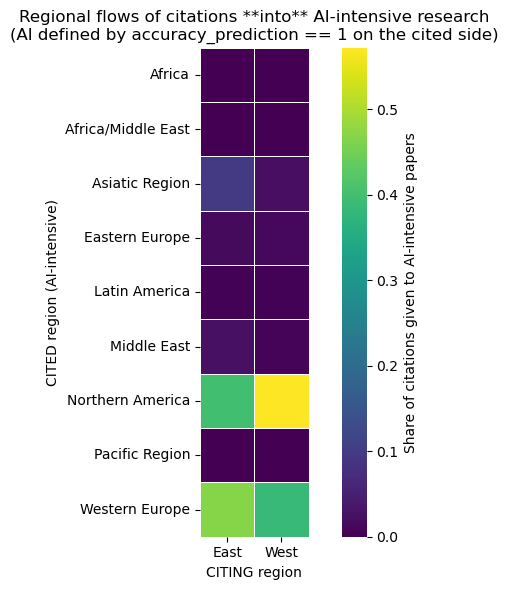

In [37]:

# C) keep variables we need and rename for clarity
edges = edges.rename(columns={
        'Pub_Region'          : 'region_cited',
        'Accuracy_Prediction' : 'acc_cited',
        'region'              : 'region_citing'    # from nested dict
})

print("Edges Done\n")

# --------------------------------------------------
# 2) filter: AI-intensive target only
AI = 1                            # acc_cited == 1 ⇢ AI-intensive
ai_edges = edges[edges['acc_cited'] == AI]

print("Filter Done\n")
# --------------------------------------------------
# 3) build REGION⇠REGION matrix (rows = AI-paper region, cols = citing region)
mat = (ai_edges
       .groupby(['region_cited', 'region_citing'])
       .size()
       .unstack(fill_value=0))

print("Region-Region Matrix Done\n")
# optional: convert to column-shares (so each citing column sums to 1)
M = mat.div(mat.sum(axis=0), axis=1)

# --------------------------------------------------
# 4) visualise
plt.figure(figsize=(7, 6))
sns.heatmap(M,
            cmap='viridis',
            linewidths=.4,
            square=True,
            cbar_kws={'label': 'Share of citations given to AI-intensive papers'})
plt.title('Regional flows of citations **into** AI-intensive research\n'
          '(AI defined by accuracy_prediction == 1 on the cited side)')
plt.xlabel('CITING region')
plt.ylabel('CITED region (AI-intensive)')
plt.tight_layout()
plt.show()


/tmp/ipykernel_2689808/118125166.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['pub_month'] = df['Publication_Date'].dt.to_period('M').dt.to_timestamp()


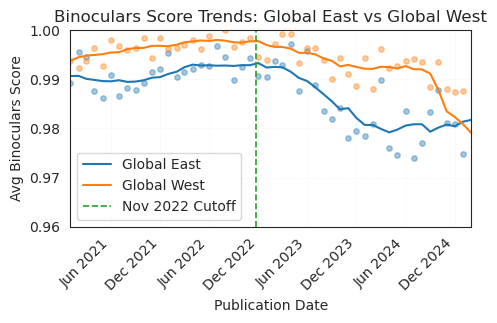

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

# ------------------------------------------------------------
# 1.  Prep: correct dtypes
# ------------------------------------------------------------
df['Binoculars_Score'] = pd.to_numeric(df['Binoculars_Score'], errors='coerce')
df['Publication_Date'] = pd.to_datetime(df['Publication_Date'], errors='coerce')

# keep only rows with a valid date & score
df = df.dropna(subset=['Publication_Date', 'Binoculars_Score'])

# ------------------------------------------------------------
# 2.  Monthly averages by East / West
# ------------------------------------------------------------
df['pub_month'] = df['Publication_Date'].dt.to_period('M').dt.to_timestamp()

monthly = (df
           .groupby(['pub_month', 'from_east'])['Binoculars_Score']
           .mean()
           .reset_index())

# optional: 3-month centred rolling mean for smoother curves
monthly['smoothed'] = (monthly
                       .groupby('from_east')['Binoculars_Score']
                       .apply(lambda s: s.rolling(10, center=True,
                                                  min_periods=1).mean())
                       .reset_index(level=0, drop=True))

east  = monthly[monthly['from_east'] == 1]
west  = monthly[monthly['from_east'] == 0]

# ------------------------------------------------------------
# 3.  y-axis limits = mean ± 3 SD (entire dataset)
# ------------------------------------------------------------
mu = df['Binoculars_Score'].mean()
sd = df['Binoculars_Score'].std()
y_min, y_max = 0.96, 1.0

# ------------------------------------------------------------
# 4.  Plot
# ------------------------------------------------------------
plt.figure(figsize=(5, 3.33))          # ACM-style size
sns.set_style("white")

tab  = plt.cm.tab10.colors             # TAB:COLORS palette
east_c, west_c, cut_c = tab[0], tab[1], tab[2]

# East line
plt.plot(east['pub_month'], east['smoothed'],
         color=east_c,  linewidth=1.5, label='Global East')
plt.scatter(east['pub_month'], east['Binoculars_Score'],
            s=15, color=east_c, alpha=0.4)

# West line
plt.plot(west['pub_month'], west['smoothed'],
         color=west_c, linewidth=1.5, label='Global West')
plt.scatter(west['pub_month'], west['Binoculars_Score'],
            s=15, color=west_c, alpha=0.4)

# Cut-off marker
cutoff = pd.Timestamp('2022-11-23')
plt.axvline(cutoff, color=cut_c, linestyle='--', linewidth=1.2,
            label='Nov 2022 Cutoff')

# Formatting
plt.ylim(y_min, y_max)
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
plt.xticks(rotation=45, ha='right')

# --- NEW: clamp the x-axis to Jan 2021 – Jan 2025 --------------------
start = pd.Timestamp('2021-01-01')
end   = pd.Timestamp('2025-01-31')      # end is exclusive; use 2025-01-31 if preferred
ax.set_xlim(start, end)
# ---------------------------------------------------------------------

plt.xlabel('Publication Date')
plt.ylabel('Average Binoculars Score')
plt.title('Binoculars Score Trends (Lower = Less AI')

plt.xlabel('Publication Date')
plt.ylabel('Avg Binoculars Score')
plt.title('Binoculars Score Trends: Global East vs Global West')
plt.grid(True, linestyle=':', linewidth=0.5, alpha=0.3)
plt.legend(frameon=True, loc='best')
plt.tight_layout()

# Save high-res versions
plt.savefig('east_west_binoculars_trend.png', dpi=1200, bbox_inches='tight')
plt.show()


In [39]:
# now by Auth_Region_C
region_monthly = (df
    .groupby(['pub_month','Auth_Region_C'])['Binoculars_Score']
    .mean()
    .reset_index()
)

In [40]:
# Smooth all region lines (rolling 10-month mean)
region_monthly['smoothed'] = (
    region_monthly
    .groupby('Auth_Region_C')['Binoculars_Score']
    .apply(lambda s: s.rolling(10, center=True, min_periods=1).mean())
    .reset_index(level=0, drop=True)
)


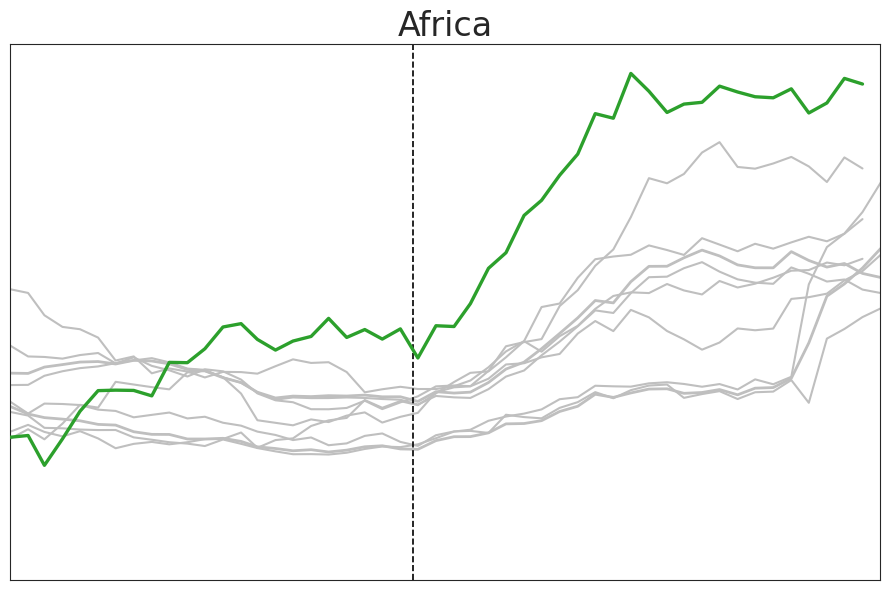

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ———————————————————————————————————————
# 1) Assume you already have:
#    east, west: DataFrames with columns
#      ['pub_month','Binoculars_Score','smoothed']
#    region_monthly: DataFrame with columns
#      ['pub_month','Auth_Region_C','Binoculars_Score']
# ———————————————————————————————————————

# list of all regions and the one to highlight
REGIONS = region_monthly['Auth_Region_C'].unique()
HIGHLIGHT = REGIONS[0]    # ◄ change as desired

# 2) Build the plot
fig, ax = plt.subplots(figsize=(9, 6))


# 2a) East & West baselines
ax.plot(east['pub_month'], east['smoothed'],
        color='#BFBFBF', lw=2, label='Global East')
ax.plot(west['pub_month'], west['smoothed'],
        color='#BFBFBF', lw=2, label='Global West')

# 2b) All other regions (gray) + highlighted region (green)
for region in REGIONS:
    d = region_monthly[region_monthly['Auth_Region_C'] == region]
    x = d['pub_month']
    y = d['smoothed']  # <-- use smoothed values
    if region == HIGHLIGHT:
        ax.plot(x, y,
                color='tab:green', lw=2.4, zorder=10,
                label=f'{HIGHLIGHT} (highlight)')
    else:
        ax.plot(x, y,
                color='#BFBFBF', lw=1.5, zorder=1)


# 2c) Cutoff line
cutoff = pd.Timestamp('2022-11-23')
ax.axvline(cutoff, color='black', linestyle='--', lw=1.2,
           label='Nov 23 2022 cutoff')

# 3) Formatting
ax.set_xlim(pd.Timestamp('2021-01-01'),
            pd.Timestamp('2025-01-31'))
ax.set_ylim(0.96, 1.01)
ax.invert_yaxis()

ax.set_xticks([])  # removes x-axis ticks and labels
ax.set_yticks([])  # removes y-axis ticks and labels
#ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
#ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
#plt.xticks(rotation=45, ha='right')
ax.set_title(HIGHLIGHT, fontsize=24, fontweight=500)

plt.tight_layout()
plt.show()


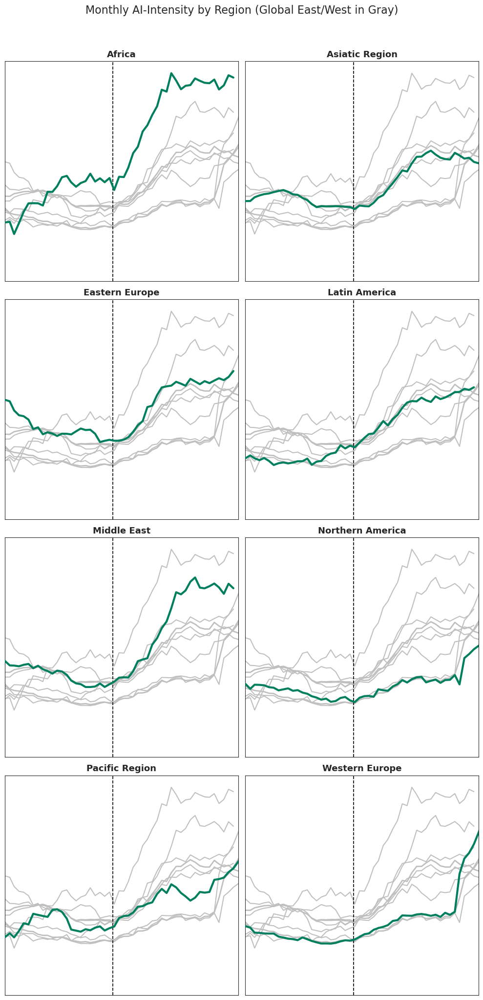

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Assume 'east', 'west', 'region_monthly' are already defined
# and contain smoothed binoculars scores

# Unique regions (assumed to be 9 total)
REGIONS = sorted(region_monthly['Auth_Region_C'].unique())

# Start 3x3 subplot grid
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 20), sharex=True, sharey=True)

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through each region and corresponding subplot
for i, region in enumerate(REGIONS):
    ax = axes[i]

    # Plot East & West baselines (smoothed)
    ax.plot(east['pub_month'], east['smoothed'],
            color='#BFBFBF', lw=2, label='Global East')
    ax.plot(west['pub_month'], west['smoothed'],
            color='#BFBFBF', lw=2, label='Global West')

    # Plot all regions in gray, highlight current in green
    for r in REGIONS:
        d = region_monthly[region_monthly['Auth_Region_C'] == r]
        x = d['pub_month']
        y = d['smoothed']
        if r == region:
            ax.plot(x, y, color='#007F5F', lw=3, zorder=10)
        else:
            ax.plot(x, y, color='#BFBFBF', lw=1.5, zorder=1)

    # Cutoff line
    cutoff = pd.Timestamp('2022-11-23')
    ax.axvline(cutoff, color='black', linestyle='--', lw=1.2)

    # Formatting
    ax.set_xlim(pd.Timestamp('2021-01-01'), pd.Timestamp('2025-01-31'))
    ax.set_ylim(0.96, 1.01)
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(region, fontsize=13, fontweight='semibold')

# Remove any unused subplots if less than 9
for j in range(len(REGIONS), 8):
    fig.delaxes(axes[j])

plt.suptitle("Monthly AI‐Intensity by Region (Global East/West in Gray)", fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("AI_C.png", transparent=True, dpi=300)
plt.show()


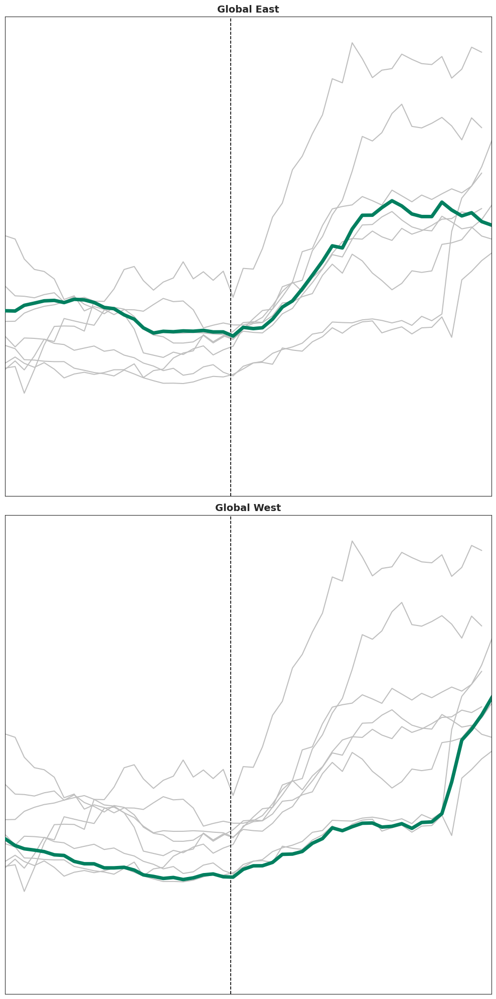

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ———————————————————————————————————————
# Prereqs: assume 'east', 'west', and 'region_monthly'
# have smoothed binocular scores and valid dates
# ———————————————————————————————————————

# Set up the figure
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 20), sharex=True, sharey=True)

# Flatten axes
titles = ['Global East', 'Global West']
highlights = [1, 0]  # from_east == 1 (East), 0 (West)

for ax, highlight, title in zip(axes, highlights, titles):
    # Plot baseline gray lines for all regions
    for region in region_monthly['Auth_Region_C'].unique():
        d = region_monthly[region_monthly['Auth_Region_C'] == region]
        ax.plot(d['pub_month'], d['smoothed'], color='#BFBFBF', lw=1.5, zorder=1)

    # Highlight East or West
    data = east if highlight == 1 else west
    ax.plot(data['pub_month'], data['smoothed'],
            color='#007F5F', lw=5, zorder=10)

    # Cutoff line
    cutoff = pd.Timestamp('2022-11-23')
    ax.axvline(cutoff, color='black', linestyle='--', lw=1.2)

    # Formatting
    ax.set_xlim(pd.Timestamp('2021-01-01'), pd.Timestamp('2025-01-31'))
    ax.set_ylim(0.96, 1.01)
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title, fontsize=14, fontweight='semibold')

plt.tight_layout()
plt.savefig("AI_H.png", transparent=True,dpi=300)
plt.show()


In [44]:
# Define your country to region map
country_to_region_map = {}
for region, countries in region_country_map.items():
    for country in countries:
        country_to_region_map[country] = region

# Function to enrich each citation with a region_c
def add_region_to_citations(citation_list):
    if not isinstance(citation_list,list):
        return citation_list
    for citation in citation_list:
        country = citation.get("Citing_Affiliation_Country")
        citation["region_c"] = country_to_region_map.get(country, "Unknown")
    return citation_list

# Apply to your dataframe
df['Citations'] = df['Citations'].apply(add_region_to_citations)


/tmp/ipykernel_2689808/778859754.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Citations'] = df['Citations'].apply(add_region_to_citations)


In [45]:
from collections import Counter
import pandas as pd

# Create a list of (source_region, target_region) tuples
flows = []
for _, row in df.iterrows():
    source = row["Auth_Region_C"]
    citations = row.get("Citations", [])
    if not isinstance(citations, list):
        continue
    for citation in citations:
        target = citation.get("region_c", "Unknown")
        flows.append((source, target))

# Count frequency of each flow
flow_counts = Counter(flows)


In [46]:
chord_df = pd.DataFrame([
    {"source": s, "target": t, "value": v}
    for (s, t), v in flow_counts.items()
])


In [47]:
# Remove rows with missing region assignments
chord_df = chord_df.dropna(subset=["source", "target"])


In [48]:
chord_df.head(20)

,source,target,value
0,Asiatic Region,Asiatic Region,415078
1,Asiatic Region,Northern America,27634
2,Middle East,Middle East,13592
3,Middle East,Unknown,2888
4,Western Europe,Asiatic Region,66191
5,Middle East,Asiatic Region,29388
6,Middle East,Pacific Region,722
7,Northern America,Northern America,73263
8,Northern America,Asiatic Region,81915
9,Northern America,Western Europe,39067


In [49]:
#!pip install holoviews


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
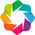

:Chord   [source,target]   (value)

In [50]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim

hv.extension('bokeh')

# Drop missing data just in case
chord_df = chord_df.dropna(subset=["source", "target"])

# Ensure link values are numeric
chord_df["value"] = pd.to_numeric(chord_df["value"], errors="coerce")
chord_df = chord_df.dropna(subset=["value"])

# Create unique region list and assign node index
regions = sorted(set(chord_df["source"]).union(chord_df["target"]))
region_to_id = {region: i for i, region in enumerate(regions)}

# Format nodes and edges for HoloViews
nodes_df = pd.DataFrame({'index': regions})
edges_df = pd.DataFrame({
    'source': chord_df['source'],
    'target': chord_df['target'],
    'value': chord_df['value']
})

# Create HoloViews Chord diagram
nodes = hv.Dataset(nodes_df, 'index')
chord = hv.Chord((edges_df, nodes)).opts(
    opts.Chord(
        cmap='Category20',
        edge_color=dim('source'),
        node_color=dim('index'),
        labels='index',
        width=600,
        height=600,
        title="Citation Flow Across Regions"
    )
)

chord


In [51]:
import panel as pn
pn.extension()

# Convert to Panel object
pane = pn.panel(chord)

# Save as a static image (e.g., PNG or HTML)
pane.save('citation_chord_static', embed=True)  # saves HTML with embedded plot


In [52]:
# Only keep articles with accurate predictions and post-GPT publication
df_filtered = df[(df["Accuracy_Prediction"] == 0) & (df["post_chatgpt"] == 1)].copy()


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
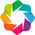

In [53]:
from collections import Counter
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
import panel as pn

hv.extension('bokeh')
pn.extension()

# Step 1: Count flows (from Auth_Region_C to citation region_c)
flows = []
for _, row in df_filtered.iterrows():
    source = row["Auth_Region_C"]
    citations = row.get("Citations", [])
    if not isinstance(citations, list):
        continue
    for citation in citations:
        target = citation.get("region_c", "Unknown")
        flows.append((source, target))

flow_counts = Counter(flows)

# Step 2: Create DataFrame
chord_df = pd.DataFrame([
    {"source": s, "target": t, "value": v}
    for (s, t), v in flow_counts.items()
])

# Step 3: Clean and prep for plotting
chord_df = chord_df.dropna(subset=["source", "target"])
chord_df["value"] = pd.to_numeric(chord_df["value"], errors="coerce")
chord_df = chord_df.dropna(subset=["value"])

# Step 4: HoloViews Chord formatting
regions = sorted(set(chord_df["source"]).union(chord_df["target"]))
nodes_df = pd.DataFrame({'index': regions})
edges_df = pd.DataFrame({
    'source': chord_df['source'],
    'target': chord_df['target'],
    'value': chord_df['value']
})

nodes = hv.Dataset(nodes_df, 'index')
chord = hv.Chord((edges_df, nodes)).opts(
    opts.Chord(
        cmap='Category20',
        edge_color=dim('source'),
        node_color=dim('index'),
        labels='index',
        width=600,
        height=600,
        title="Citation Flow (Accuracy=1 Only)"
    )
)

# Step 5: Save to HTML
pane = pn.panel(chord)
pane.save('citation_chord_static_accuracy1', embed=True)  # saves to HTML


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
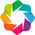

In [54]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
from collections import Counter
import panel as pn

hv.extension('bokeh')
pn.extension()

# STEP 1: Filter only accurate + post-GPT articles
df_filtered = df[
    (df["Accuracy_Prediction"] == 1) & 
    (df["post_chatgpt"] == 1)
].copy()

# STEP 2: Drop rows with missing Citations
df_filtered = df_filtered[df_filtered['Citations'].notna()]

# STEP 3: Extract Global East/West flow tuples from each citation
flows = []
for _, row in df_filtered.iterrows():
    source = "East" if row["from_east"] == 1 else "West"
    citations = row.get("Citations", [])
    if not isinstance(citations, list):
        continue
    for citation in citations:
        target = "East" if citation.get("east") == 1 else "West"
        flows.append((source, target))

# STEP 4: Count unique flow combinations
flow_counts = Counter(flows)

# STEP 5: Construct Chord input dataframe
chord_df = pd.DataFrame([
    {"source": s, "target": t, "value": v}
    for (s, t), v in flow_counts.items()
])

# STEP 6: Create Chord diagram
regions = sorted(set(chord_df["source"]).union(chord_df["target"]))
nodes_df = pd.DataFrame({'index': regions})
edges_df = pd.DataFrame({
    'source': chord_df['source'],
    'target': chord_df['target'],
    'value': chord_df['value']
})

nodes = hv.Dataset(nodes_df, 'index')
chord = hv.Chord((edges_df, nodes)).opts(
    opts.Chord(
        cmap='PiYG',
        edge_color=dim('source'),
        node_color=dim('index'),
        labels='index',
        width=600,
        height=600,
        title="Citation Flows: Global East ↔ Global West"
    )
)

# Show interactive
chord

# STEP 7: Save as HTML (optional)
pn.panel(chord).save('chord_east_west_postgpt.html', embed=True)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
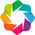

In [55]:
from collections import Counter
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
import panel as pn

hv.extension('bokeh')
pn.extension()

# === STEP 1: Filter out necessary rows (optional: Accuracy=1 and post_gpt=1) ===
df_filtered = df[
    (df["Accuracy_Prediction"] == 1) &
    (df["post_chatgpt"] == 1) &
    (df["Citations"].notna())
].copy()

# === STEP 2: Build (source_country, target_country) flows ===
flows = []
for _, row in df_filtered.iterrows():
    source = row.get("Affiliation_Country", "Unknown")
    citations = row.get("Citations", [])
    if not isinstance(citations, list):
        continue
    for citation in citations:
        target = citation.get("Citing_Affiliation_Country", "Unknown")
        flows.append((source, target))

flow_counts = Counter(flows)

# === STEP 3: Create DataFrame of flow counts ===
chord_df = pd.DataFrame([
    {"source": s, "target": t, "value": v}
    for (s, t), v in flow_counts.items()
])

chord_df = chord_df.dropna(subset=["source", "target"])
chord_df["value"] = pd.to_numeric(chord_df["value"], errors="coerce")
chord_df = chord_df.dropna(subset=["value"])

# === STEP 4: Format data for Holoviews Chord ===
countries = sorted(set(chord_df["source"]).union(chord_df["target"]))
nodes_df = pd.DataFrame({'index': countries})
edges_df = pd.DataFrame({
    'source': chord_df['source'],
    'target': chord_df['target'],
    'value': chord_df['value']
})

nodes = hv.Dataset(nodes_df, 'index')
chord = hv.Chord((edges_df, nodes)).opts(
    opts.Chord(
        cmap='Category20',                        # or any colormap like 'Set3'
        edge_color=dim('target'),                 # You can switch to 'source' to color by sender
        node_color=dim('index'),
        labels='index',
        width=800,
        height=800,
        title="Country-to-Country Citation Flows (Accuracy=1, Post-GPT)"
    )
)

# === STEP 5: Save as HTML ===
pane = pn.panel(chord)
pane.save('citation_chord_country_flow.html', embed=True)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
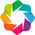

In [56]:
from collections import Counter
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
import panel as pn

hv.extension('bokeh')
pn.extension()

# === STEP 1: Filter dataset ===
df_filtered = df[
    (df["Accuracy_Prediction"] == 1) &
    (df["post_chatgpt"] == 1) &
    (df["Citations"].notna())
].copy()

# === STEP 2: Extract (source, target) country pairs ===
flows = []
for _, row in df_filtered.iterrows():
    source = row.get("Affiliation_Country", "Unknown")
    citations = row.get("Citations", [])
    if not isinstance(citations, list):
        continue
    for citation in citations:
        target = citation.get("Citing_Affiliation_Country", "Unknown")
        flows.append((source, target))

# === STEP 3: Count flows ===
flow_counts = Counter(flows)
chord_df = pd.DataFrame([
    {"source": s, "target": t, "value": v}
    for (s, t), v in flow_counts.items()
])

chord_df = chord_df.dropna(subset=["source", "target"])
chord_df["value"] = pd.to_numeric(chord_df["value"], errors="coerce")
chord_df = chord_df.dropna(subset=["value"])

# === STEP 4: Limit to top 20 countries involved in citations ===
# Count total appearances across both source and target
all_countries = pd.concat([chord_df["source"], chord_df["target"]])
top_20 = all_countries.value_counts().head(20).index.tolist()

# Keep only flows where both source and target are in top 20
chord_df = chord_df[
    chord_df["source"].isin(top_20) &
    chord_df["target"].isin(top_20)
]

# === STEP 5: Format for Holoviews Chord ===
countries = sorted(set(chord_df["source"]).union(chord_df["target"]))
nodes_df = pd.DataFrame({'index': countries})
edges_df = pd.DataFrame({
    'source': chord_df['source'],
    'target': chord_df['target'],
    'value': chord_df['value']
})

nodes = hv.Dataset(nodes_df, 'index')
chord = hv.Chord((edges_df, nodes)).opts(
    opts.Chord(
        cmap='Category20',
        edge_color=dim('target'),     # You can change to 'source'
        node_color=dim('index'),
        labels='index',
        width=800,
        height=800,
        title="Citation Flow Between Top 20 Countries"
    )
)

# === STEP 6: Save to HTML ===
pn.panel(chord).save('citation_chord_top20_countries.html', embed=True)


In [57]:
from collections import Counter
import pandas as pd

# Step 1: Construct (source_country, target_country) pairs
flows = []
for _, row in df.iterrows():
    source_country = row.get("Affiliation_Country")
    citations = row.get("Citations", [])
    if not isinstance(citations, list):
        continue
    for citation in citations:
        target_country = citation.get("Citing_Affiliation_Country")
        if source_country and target_country:
            flows.append((source_country, target_country))

# Step 2: Count frequencies
flow_counts = Counter(flows)

# Step 3: Convert to DataFrame
country_net = pd.DataFrame([
    {"source": s, "target": t, "value": v}
    for (s, t), v in flow_counts.items()
])

# Optional: Drop missing or unknown
country_net = country_net.dropna(subset=["source", "target"])


In [58]:
country_net = country_net[(country_net['source'] != 'N/A') & (country_net['target'] != 'N/A')]
country_net.head(20)

,source,target,value
0,India,Indonesia,1380
1,China,China,240673
2,China,United States,12761
3,Israel,Israel,536
4,Iraq,Vietnam,37
5,Germany,China,6410
6,Israel,Hong Kong,60
7,Israel,Australia,80
8,Canada,Canada,2723
9,Canada,United States,2453


In [59]:
import networkx as nx
import matplotlib.pyplot as plt

# Initialize directed graph
G = nx.DiGraph()

# Add edges with weights
for _, row in country_net.iterrows():
    source = row['source']
    target = row['target']
    weight = row['value']
    G.add_edge(source, target, weight=weight)




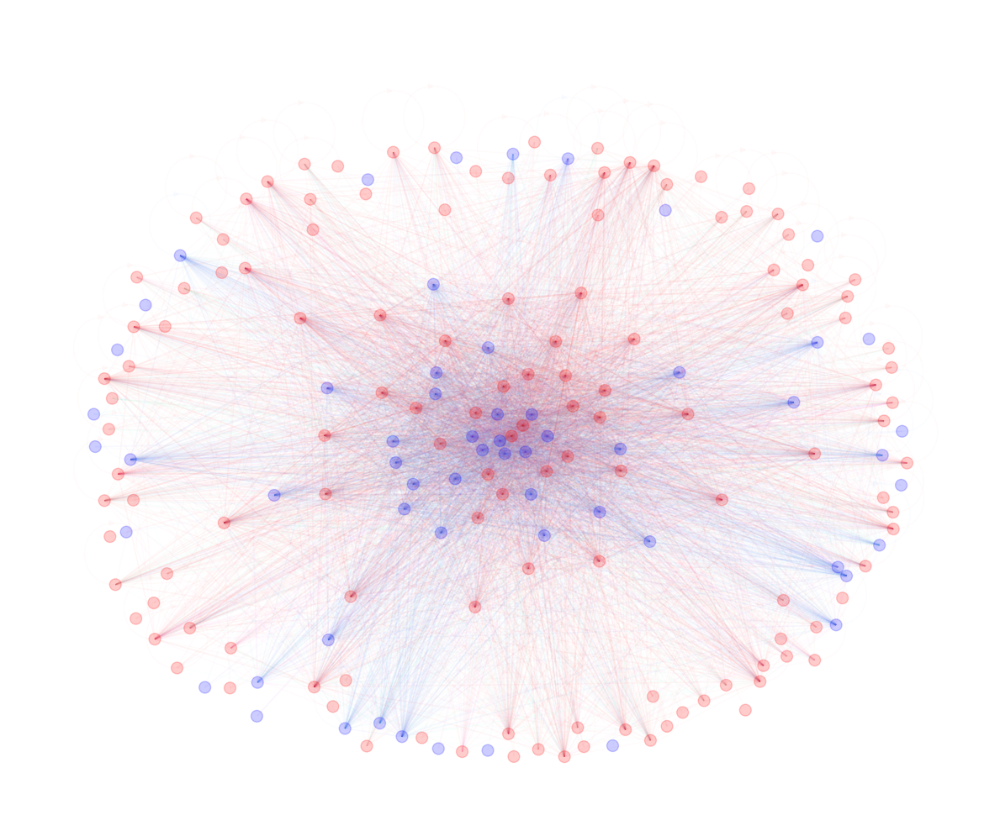

In [60]:
# Node colors based on Global East membership
node_colors = ['red' if node in global_east else 'blue' for node in G.nodes()]

# Draw network
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G, k=5, iterations=50, seed=42)

def edge_color_map(source, target):
    if source in global_east and target in global_east:
        return "#FF3C3C"  # glowing red
    elif source not in global_east and target not in global_east:
        return "#3C8DFF"  # glowing blue
    elif source not in global_east and target in global_east:
        return "#3CFFD5"  # cyan (West → East)
    elif source in global_east and target not in global_east:
        return "#FF3CFD"  # magenta (East → West)
    else:
        return "#888888"
edge_colors = [edge_color_map(s, t) for s, t in G.edges()]

nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.2)
nx.draw_networkx_edges(G, pos, arrows=False, edge_color=edge_colors, alpha=0.02)
#nx.draw_networkx_labels(G, pos, font_size=8)

plt.gca().set_facecolor("#0b0c1d")  # Deep space background
plt.title("Country-Level Citation Network", fontsize=20, color="white", pad=20)
plt.axis('off')
plt.tight_layout()
plt.savefig("citation_nebulae.png", dpi=300, bbox_inches='tight', facecolor="#0b0c1d")
plt.show()


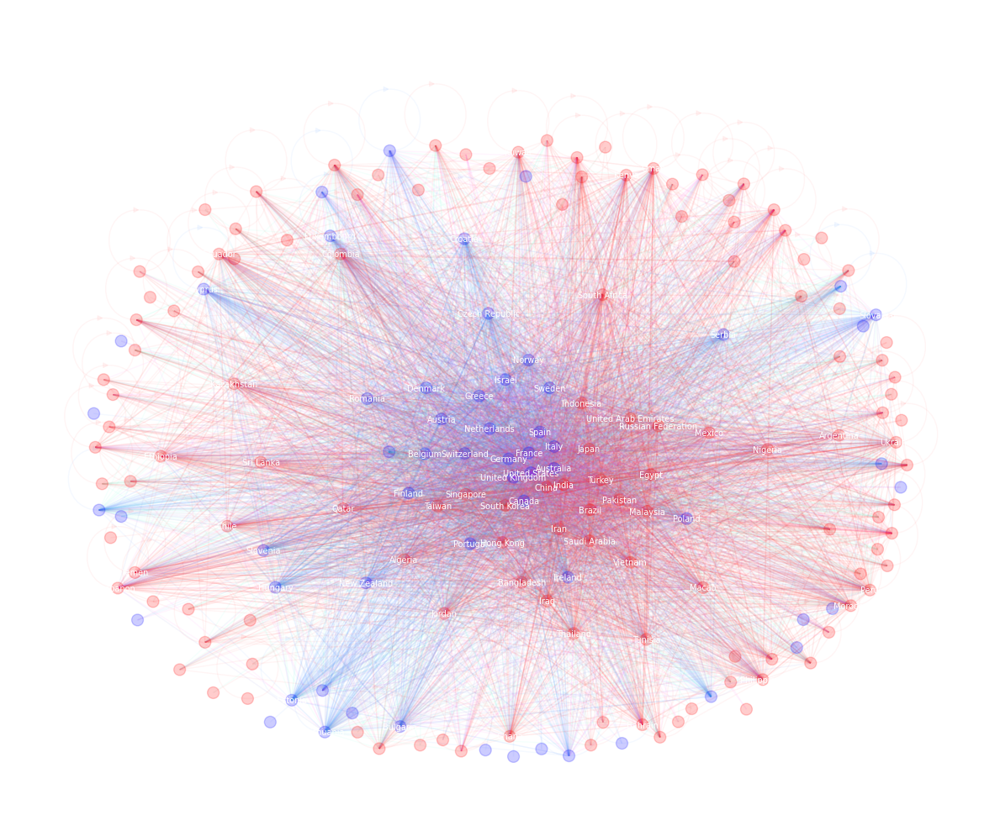

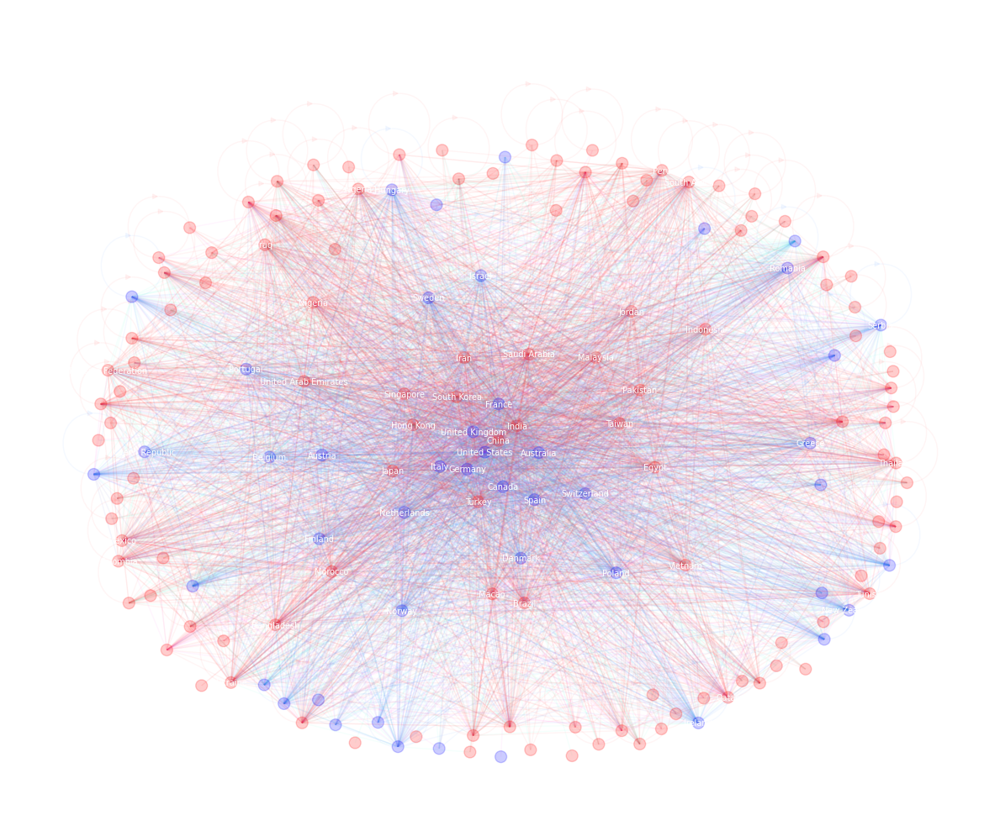

In [61]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# Assume df and global_east set are already defined
# Also assumes 'Affiliation_Country' and 'Citations' columns are available

# ───────────────────────────────────────────────
# 1. Filter Pre- and Post-GPT Article Sets
# ───────────────────────────────────────────────
df_pre_gpt = df[df['post_chatgpt'] == 0].copy()
df_post_gpt = df[df['post_chatgpt'] == 1].copy()

# ───────────────────────────────────────────────
# 2. Helper Function: Extract Country-to-Country Flows
# ───────────────────────────────────────────────
def extract_country_edges(df_subset):
    flows = []
    for _, row in df_subset.iterrows():
        source = row.get("Affiliation_Country")
        citations = row.get("Citations", [])
        if not isinstance(citations, list):
            continue
        for citation in citations:
            target = citation.get("Citing_Affiliation_Country")
            if source and target and target != "N/A":
                flows.append((source, target))
    flow_counts = Counter(flows)
    return pd.DataFrame([
        {"source": s, "target": t, "value": v}
        for (s, t), v in flow_counts.items()
    ])

# ───────────────────────────────────────────────
# 3. Generate Citation DataFrames
# ───────────────────────────────────────────────
country_net_pre_gpt = extract_country_edges(df_pre_gpt)
country_net_post_gpt = extract_country_edges(df_post_gpt)

# ───────────────────────────────────────────────
# 4. Graph Construction Function
# ───────────────────────────────────────────────
def build_graph(df_edges):
    G = nx.DiGraph()
    for _, row in df_edges.iterrows():
        src, tgt, weight = row['source'], row['target'], row['value']
        G.add_edge(src, tgt, weight=weight)
    return G

# ───────────────────────────────────────────────
# 5. Visualization Function
# ───────────────────────────────────────────────
def draw_graph(G, title, file_out):
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G, k=5, iterations=50, seed=42)

    # Node color: red (East), blue (West)
    node_colors = ['red' if node in global_east else 'blue' for node in G.nodes()]

    # Edge color: direction-sensitive glow
    def edge_color_map(s, t):
        if s in global_east and t in global_east:
            return "#FF3C3C"  # Glowing red
        elif s not in global_east and t not in global_east:
            return "#3C8DFF"  # Glowing blue
        elif s not in global_east and t in global_east:
            return "#3CFFD5"  # Cyan (West → East)
        elif s in global_east and t not in global_east:
            return "#FF3CFD"  # Magenta (East → West)
        else:
            return "#888888"

    edge_colors = [edge_color_map(s, t) for s, t in G.edges()]

    nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.2)
    nx.draw_networkx_edges(G, pos, arrows=False, edge_color=edge_colors, alpha=0.05)
    # Optional: label important countries
    important_nodes = [n for n in G.nodes if G.degree(n) > 100]
    nx.draw_networkx_labels(G, pos, labels={n: n for n in important_nodes}, font_size=7, font_color="white")

    plt.gca().set_facecolor("#0b0c1d")  # Deep space background
    plt.title(title, fontsize=18, color="white", pad=20)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(file_out, dpi=600, bbox_inches='tight', format='png', transparent=True)
    plt.show()

# ───────────────────────────────────────────────
# 6. Build and Visualize
# ───────────────────────────────────────────────
G_pre = build_graph(country_net_pre_gpt)
G_post = build_graph(country_net_post_gpt)

draw_graph(G_pre, "Citation Network (Pre-GPT)", "citation_pre_gpt.png")
draw_graph(G_post, "Citation Network (Post-GPT)", "citation_post_gpt.png")


In [62]:
import pandas as pd
import networkx as nx
from collections import Counter, defaultdict

# ─────────────────────────────────────────────────────────────
# Prerequisites
# ─────────────────────────────────────────────────────────────
# Assumes df, global_east, and country_to_region_map are already defined

# ─────────────────────────────────────────────────────────────
# Filter datasets by post-GPT flag
# ─────────────────────────────────────────────────────────────
df_pre = df[df['post_chatgpt'] == 0].copy()
df_post = df[df['post_chatgpt'] == 1].copy()

# ─────────────────────────────────────────────────────────────
# Function to Extract Edges (Citing relationships)
# ─────────────────────────────────────────────────────────────
def extract_edges(df_subset):
    flows = []
    for _, row in df_subset.iterrows():
        src = row.get("Affiliation_Country")
        citations = row.get("Citations", [])
        if not isinstance(citations, list):
            continue
        for citation in citations:
            tgt = citation.get("Citing_Affiliation_Country")
            if src and tgt and tgt != "N/A":
                flows.append((src, tgt))
    return Counter(flows)

# ─────────────────────────────────────────────────────────────
# Function to Build Graph and Calculate Centrality Metrics
# ─────────────────────────────────────────────────────────────
def compute_centrality(df_subset):
    centrality_data = []

    # Monthly loop
    df_subset['month'] = pd.to_datetime(df_subset['Publication_Date']).dt.to_period('M').dt.to_timestamp()
    months = sorted(df_subset['month'].unique())

    for month in months:
        df_month = df_subset[df_subset['month'] == month]

        # Create edge list for the month
        edge_counter = extract_edges(df_month)
        G = nx.DiGraph()
        for (src, tgt), weight in edge_counter.items():
            G.add_edge(src, tgt, weight=weight)

        # Centrality measures
        in_deg = nx.in_degree_centrality(G)
        betw = nx.betweenness_centrality(G)

        # Average binoculars score by source country
        scores = df_month.groupby('Affiliation_Country')['Binoculars_Score'].mean().to_dict()

        # SJR tier article counts by country
        sjr_counts = df_month.groupby(['Affiliation_Country', 'SJR Best Quartile']).size().unstack(fill_value=0)
        all_countries = set(G.nodes)

        for country in all_countries:
            centrality_data.append({
                'month': month,
                'country': country,
                'in_degree': in_deg.get(country, 0),
                'betweenness': betw.get(country, 0),
                'binoculars_avg': scores.get(country, None),
                'q1_count': sjr_counts.loc[country].get('Q1', 0) if country in sjr_counts.index else 0,
                'q2_count': sjr_counts.loc[country].get('Q2', 0) if country in sjr_counts.index else 0,
                'q3_count': sjr_counts.loc[country].get('Q3', 0) if country in sjr_counts.index else 0,
                'q4_count': sjr_counts.loc[country].get('Q4', 0) if country in sjr_counts.index else 0,
                'total_articles': df_month[df_month['Affiliation_Country'] == country].shape[0],
                'is_east': 1 if country in global_east else 0,
                'continent': country_to_region_map.get(country, "Unknown")
            })

    return pd.DataFrame(centrality_data)

# ─────────────────────────────────────────────────────────────
# Apply function to Pre- and Post-GPT subsets
# ─────────────────────────────────────────────────────────────
centrality_pre = compute_centrality(df_pre)
centrality_post = compute_centrality(df_post)

# Optional: Save to file
centrality_pre.to_csv("centrality_pre_gpt.csv", index=False)
centrality_post.to_csv("centrality_post_gpt.csv", index=False)


In [63]:
df.head()

,Scopus_ID,Title,Abstract,Authors,Affiliation_Name,Affiliation_Country,Publication_Date,DOI,Keywords,Cited_By_Count,...,Citation_in_Eastern Europe,Citation_in_Latin America,Citation_in_Northern America,Citation_in_Western Europe,Citation_in_Africa,Citation_in_Pacific Region,Cite_Same_C,Cite_Diff_C,Category_Main,pub_month
0,85184748559,A DOCTOR RECOMMENDATION AND BREAST CANCER PRED...,"Today, people are exposed to various diseases ...","[Rethinakumar, Ganapathy G., Kang J.-J.]",N/A,India,2023-11-30,N/A,N/A,1,...,0,0,0,0,0,0,1,0,Computer Science (miscellaneous),2023-11-01
2,85182789513,Proceedings of 2023 5th International Conferen...,The proceedings contain 14 papers. The topics ...,[],N/A,N/A,2023-11-30,N/A,N/A,0,...,0,0,0,0,0,0,0,0,None,2023-11-01
3,85182746242,RITA: Boost Driving Simulators with Realistic ...,High-quality traffic flow generation is the co...,"[Zhu Z., Zhang S., Zhuang Y., Liu Y., Liu M., ...",N/A,Hong Kong,2023-11-30,10.1145/3627676.3627681,N/A,0,...,0,0,0,0,0,0,0,0,None,2023-11-01
4,85182745664,SACAT: Student-Adaptive Computerized Adaptive ...,Computerized Adaptive Testing refers to an onl...,"[Yu J., Zhenyu M., Lei J., Yin L., Xia W., Yu ...",N/A,China,2023-11-30,10.1145/3627676.3627679,N/A,1,...,0,0,0,0,0,0,1,0,None,2023-11-01
5,85182744220,Adaptive Control Strategy for Quadruped Robots...,Quadruped robots have strong adaptability to e...,"[Wu X., Dong W., Lai H., Yu Y., Wen Y.]",N/A,China,2023-11-30,10.1145/3627676.3627686,N/A,2,...,0,0,0,0,0,0,2,0,None,2023-11-01


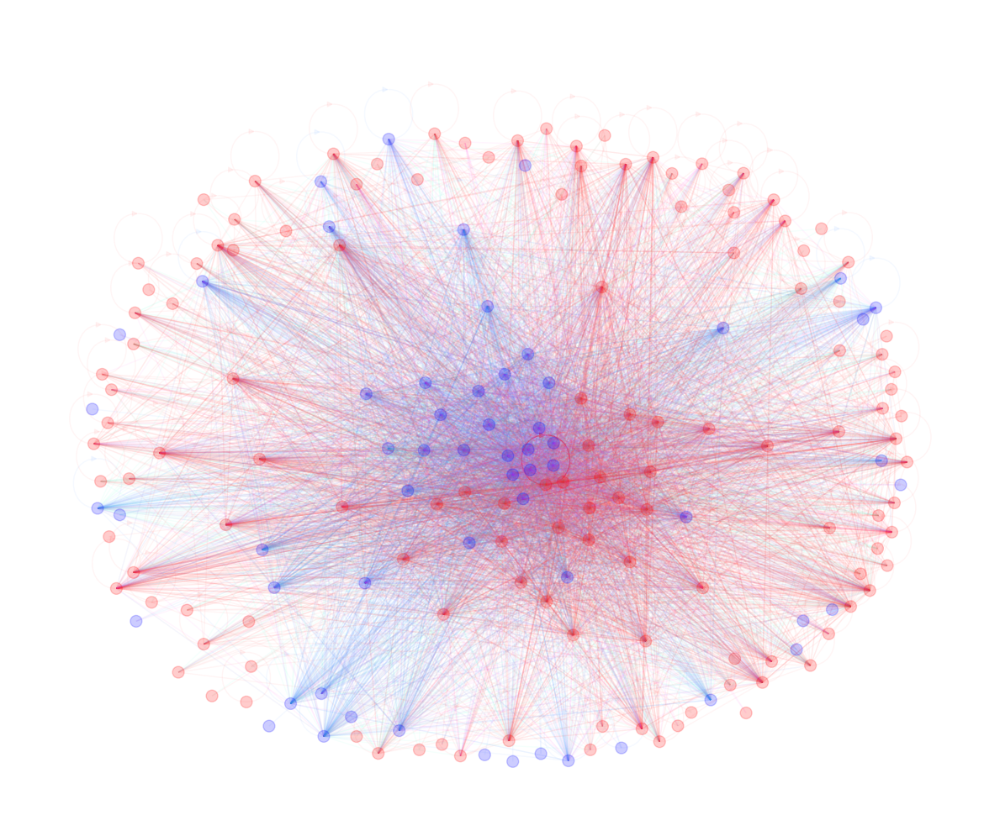

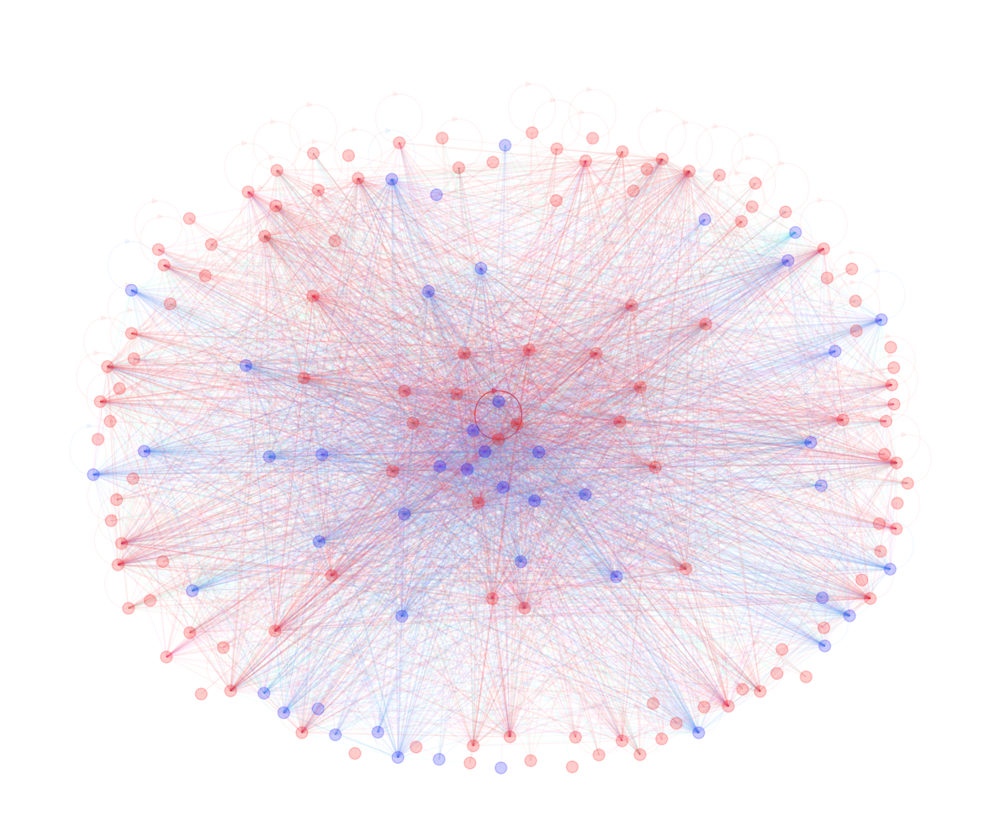

In [64]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# Assume df and global_east set are already defined
# Also assumes 'Affiliation_Country' and 'Citations' columns are available

# ───────────────────────────────────────────────
# 1. Filter Pre- and Post-GPT Article Sets
# ───────────────────────────────────────────────
df_pre_gpt = df[df['post_chatgpt'] == 0].copy()
df_post_gpt = df[df['post_chatgpt'] == 1].copy()

# ───────────────────────────────────────────────
# 2. Helper Function: Extract Country-to-Country Flows
# ───────────────────────────────────────────────
def extract_country_edges(df_subset):
    flows = []
    for _, row in df_subset.iterrows():
        source = row.get("Affiliation_Country")
        citations = row.get("Citations", [])
        if not isinstance(citations, list):
            continue
        for citation in citations:
            target = citation.get("Citing_Affiliation_Country")
            if source and target and target != "N/A":
                flows.append((source, target))
    flow_counts = Counter(flows)
    return pd.DataFrame([
        {"source": s, "target": t, "value": v}
        for (s, t), v in flow_counts.items()
    ])

# ───────────────────────────────────────────────
# 3. Generate Citation DataFrames
# ───────────────────────────────────────────────
country_net_pre_gpt = extract_country_edges(df_pre_gpt)
country_net_post_gpt = extract_country_edges(df_post_gpt)

# ───────────────────────────────────────────────
# 4. Graph Construction Function
# ───────────────────────────────────────────────
def build_graph(df_edges):
    G = nx.DiGraph()
    for _, row in df_edges.iterrows():
        src, tgt, weight = row['source'], row['target'], row['value']
        G.add_edge(src, tgt, weight=weight)
    return G

# ───────────────────────────────────────────────
# 5. Visualization Function
# ───────────────────────────────────────────────
def draw_graph(G, title, file_out):
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G, k=5, iterations=50, seed=42)

    # Node color: red (East), blue (West)
    node_colors = ['red' if node in global_east else 'blue' for node in G.nodes()]

    # Edge color: direction-sensitive glow
    def edge_color_map(s, t):
        if s in global_east and t in global_east:
            return "#FF3C3C"  # Glowing red
        elif s not in global_east and t not in global_east:
            return "#3C8DFF"  # Glowing blue
        elif s not in global_east and t in global_east:
            return "#3CFFD5"  # Cyan (West → East)
        elif s in global_east and t not in global_east:
            return "#FF3CFD"  # Magenta (East → West)
        else:
            return "#888888"

    edge_colors = [edge_color_map(s, t) for s, t in G.edges()]
    # Normalize edge weights to get glow strength
    weights = [G[u][v]['weight'] for u, v in G.edges()]
    max_weight = max(weights)
    edge_alphas = [min(0.05 + 0.95 * (w / max_weight), 1.0) for w in weights]


    nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.2)
    for ((u, v), color, alpha) in zip(G.edges(), edge_colors, edge_alphas):
        nx.draw_networkx_edges(G, pos,
            edgelist=[(u, v)],
            arrows=False,
            edge_color=color,
            alpha=alpha,
            width=1.0
        )

    # Optional: label important countries
    # Rank nodes by total degree and take top 20
    top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:20]
    important_nodes = [n for n, _ in top_nodes]

    #nx.draw_networkx_labels(G, pos, labels={n: n for n in important_nodes}, font_size=15, font_color="white")

    plt.gca().set_facecolor("#0b0c1d")  # Deep space background
    plt.title(title, fontsize=18, color="white", pad=20)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(file_out, dpi=300, bbox_inches='tight', format='png', transparent=True)
    plt.show()

# ───────────────────────────────────────────────
# 6. Build and Visualize
# ───────────────────────────────────────────────
#G_pre = build_graph(country_net_pre_gpt)
G_post = build_graph(country_net_post_gpt)

draw_graph(G_pre, "Citation Network (Pre-GPT)", "citation_pre_gpt_cover.png")
draw_graph(G_post, "Citation Network (Post-GPT)", "citation_post_gpt_cover.png")


In [65]:
def degree_centralization(G):
    centrality = nx.degree_centrality(G)
    max_c = max(centrality.values())
    sum_diffs = sum(max_c - c for c in centrality.values())
    normalized = sum_diffs / (len(G.nodes) - 1)
    return normalized

centralization_pre = degree_centralization(G_pre)
centralization_post = degree_centralization(G_post)
print(f"Pre-GPT Degree Centralization: {centralization_pre:.4f}")
print(f"Post-GPT Degree Centralization: {centralization_post:.4f}")


Pre-GPT Degree Centralization: 0.9958
Post-GPT Degree Centralization: 1.1137


In [66]:
reciprocity_pre = nx.reciprocity(G_pre)
reciprocity_post = nx.reciprocity(G_post)
print(f"Pre-GPT Reciprocity: {reciprocity_pre:.4f}")
print(f"Post-GPT Reciprocity: {reciprocity_post:.4f}")


Pre-GPT Reciprocity: 0.7505
Post-GPT Reciprocity: 0.7000


In [67]:
def directional_flows(G, global_east):
    east_to_west = 0
    west_to_east = 0
    for u, v in G.edges():
        w = G[u][v]['weight']
        if u in global_east and v not in global_east:
            east_to_west += w
        elif u not in global_east and v in global_east:
            west_to_east += w
    return {"East→West": east_to_west, "West→East": west_to_east}

flows_pre = directional_flows(G_pre, global_east)
flows_post = directional_flows(G_post, global_east)

print("Pre-GPT Directional Flows:", flows_pre)
print("Post-GPT Directional Flows:", flows_post)


Pre-GPT Directional Flows: {'East→West': 72673, 'West→East': 162614}
Post-GPT Directional Flows: {'East→West': 21684, 'West→East': 48829}


In [68]:
from networkx.algorithms.community import greedy_modularity_communities

def compute_modularity(G):
    communities = list(greedy_modularity_communities(G.to_undirected()))
    return communities, len(communities)

communities_pre, num_communities_pre = compute_modularity(G_pre)
communities_post, num_communities_post = compute_modularity(G_post)

print(f"Pre-GPT Communities: {num_communities_pre}")
print(f"Post-GPT Communities: {num_communities_post}")


Pre-GPT Communities: 8
Post-GPT Communities: 6


In [69]:
def compute_rank_shift(G_pre, G_post):
    pr_pre = nx.pagerank(G_pre, weight='weight')
    pr_post = nx.pagerank(G_post, weight='weight')
    all_nodes = set(pr_pre) | set(pr_post)
    delta = {node: pr_post.get(node, 0) - pr_pre.get(node, 0) for node in all_nodes}
    return sorted(delta.items(), key=lambda x: x[1], reverse=True)

rank_shift = compute_rank_shift(G_pre, G_post)

print("Top 10 countries gaining PageRank:")
for country, shift in rank_shift[:10]:
    print(f"{country}: +{shift:.5f}")

print("\nTop 10 countries losing PageRank:")
for country, shift in rank_shift[-10:]:
    print(f"{country}: {shift:.5f}")


Top 10 countries gaining PageRank:
China: +0.03360
Indonesia: +0.00400
Saudi Arabia: +0.00211
Nigeria: +0.00209
Turkey: +0.00207
Kazakhstan: +0.00173
Jordan: +0.00171
Pakistan: +0.00160
Croatia: +0.00137
Hong Kong: +0.00120

Top 10 countries losing PageRank:
Canada: -0.00167
France: -0.00167
New Caledonia: -0.00176
Germany: -0.00196
Tajikistan: -0.00219
India: -0.00250
Peru: -0.00286
Iraq: -0.00288
Liberia: -0.00530
United States: -0.00575


In [70]:
def directional_flow_proportions(G, global_east):
    flow_counts = {
        "East→West": 0,
        "West→East": 0,
        "East→East": 0,
        "West→West": 0
    }
    total_weight = 0

    for u, v in G.edges():
        weight = G[u][v]['weight']
        total_weight += weight

        if u in global_east and v in global_east:
            flow_counts["East→East"] += weight
        elif u not in global_east and v not in global_east:
            flow_counts["West→West"] += weight
        elif u in global_east and v not in global_east:
            flow_counts["East→West"] += weight
        elif u not in global_east and v in global_east:
            flow_counts["West→East"] += weight

    # Normalize to proportions
    proportions = {k: v / total_weight for k, v in flow_counts.items()}
    return proportions
prop_pre = directional_flow_proportions(G_pre, global_east)
prop_post = directional_flow_proportions(G_post, global_east)

print("🧭 Proportional Citation Flows — Pre-GPT:")
for k, v in prop_pre.items():
    print(f"{k}: {v:.4f}")

print("\n🧭 Proportional Citation Flows — Post-GPT:")
for k, v in prop_post.items():
    print(f"{k}: {v:.4f}")


🧭 Proportional Citation Flows — Pre-GPT:
East→West: 0.0854
West→East: 0.1911
East→East: 0.4774
West→West: 0.2460

🧭 Proportional Citation Flows — Post-GPT:
East→West: 0.0841
West→East: 0.1893
East→East: 0.5049
West→West: 0.2216


Narrative 1: GPT Reduces Citation Inequality by Geographic Origin
RQ1: Did the centrality of Global East countries increase significantly post-GPT relative to Global West Countries?

Method
Treatment Group: Global East Countries
Control Group: Global West Countries
Outcome of Interest: Change in Node Centrality (PageRank, Betweenness)



In [71]:
# data prep

import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Step 1: Get PageRank values
pagerank_pre = nx.pagerank(G_pre, weight='weight')
pagerank_post = nx.pagerank(G_post, weight='weight')

# Step 2: Build DataFrame
def build_centrality_df(pagerank_dict, period_label):
    return pd.DataFrame({
        'country': list(pagerank_dict.keys()),
        'pagerank': list(pagerank_dict.values()),
        'post_gpt': 1 if period_label == 'post' else 0,
    })

df_pre = build_centrality_df(pagerank_pre, 'pre')
df_post = build_centrality_df(pagerank_post, 'post')
centrality_df = pd.concat([df_pre, df_post], ignore_index=True)

# Step 3: Add east/west indicator
centrality_df['east'] = centrality_df['country'].apply(lambda x: 1 if x in global_east else 0)

# Step 4: Create interaction term
centrality_df['interaction'] = centrality_df['post_gpt'] * centrality_df['east']

# Run OLS regression
model = smf.ols("pagerank ~ post_gpt + east + interaction", data=centrality_df).fit()
print(model.summary())



                            OLS Regression Results                            
Dep. Variable:               pagerank   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                   0.06016
Date:                Sat, 10 May 2025   Prob (F-statistic):              0.981
Time:                        14:38:29   Log-Likelihood:                 827.35
No. Observations:                 354   AIC:                            -1647.
Df Residuals:                     350   BIC:                            -1631.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0047      0.003      1.544      

In [72]:
# Compute betweenness centrality
betweenness_pre = nx.betweenness_centrality(G_pre, weight='weight', normalized=True)
betweenness_post = nx.betweenness_centrality(G_post, weight='weight', normalized=True)
# Build dataframe
def build_betweenness_df(betweenness_dict, period_label):
    return pd.DataFrame({
        'country': list(betweenness_dict.keys()),
        'betweenness': list(betweenness_dict.values()),
        'post_gpt': 1 if period_label == 'post' else 0,
    })

df_pre_bet = build_betweenness_df(betweenness_pre, 'pre')
df_post_bet = build_betweenness_df(betweenness_post, 'post')
betweenness_df = pd.concat([df_pre_bet, df_post_bet], ignore_index=True)

# Add region dummy and interaction term
betweenness_df['east'] = betweenness_df['country'].apply(lambda x: 1 if x in global_east else 0)
betweenness_df['interaction'] = betweenness_df['post_gpt'] * betweenness_df['east']
model_bet = smf.ols("betweenness ~ post_gpt + east + interaction", data=betweenness_df).fit()
print(model_bet.summary())


                            OLS Regression Results                            
Dep. Variable:            betweenness   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.018
Method:                 Least Squares   F-statistic:                     3.172
Date:                Sat, 10 May 2025   Prob (F-statistic):             0.0244
Time:                        14:38:30   Log-Likelihood:                 1259.9
No. Observations:                 354   AIC:                            -2512.
Df Residuals:                     350   BIC:                            -2496.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0064      0.001      7.094      

In [73]:
centrality_df.head()


,country,pagerank,post_gpt,east,interaction
0,France,0.010405,0,0,0
1,United States,0.057823,0,0,0
2,New Zealand,0.002444,0,0,0
3,Spain,0.012833,0,0,0
4,Israel,0.002724,0,0,0


In [74]:
centrality_df['region'] = centrality_df['country'].map(country_to_region_map)
# Drop missing region assignments (if any)
centrality_df = centrality_df.dropna(subset=['region'])
import statsmodels.formula.api as smf

model_region = smf.ols("pagerank ~ post_gpt * C(region)", data=centrality_df).fit()
print(model_region.summary())


                            OLS Regression Results                            
Dep. Variable:               pagerank   R-squared:                       0.087
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     1.204
Date:                Sat, 10 May 2025   Prob (F-statistic):              0.263
Time:                        14:38:30   Log-Likelihood:                 511.19
No. Observations:                 234   AIC:                            -986.4
Df Residuals:                     216   BIC:                            -924.2
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [75]:
import pandas as pd

def build_country_fixed_effect_df(pagerank_pre, pagerank_post, top_countries):
    rows = []
    for country in top_countries:
        rows.append({
            "country": country,
            "pagerank": pagerank_pre.get(country, 0),
            "post_gpt": 0
        })
        rows.append({
            "country": country,
            "pagerank": pagerank_post.get(country, 0),
            "post_gpt": 1
        })
    return pd.DataFrame(rows)

# Get top 10 East and West countries as before
top10_east = sorted(
    {k: v for k, v in pagerank_pre.items() if k in global_east}.items(),
    key=lambda x: x[1],
    reverse=True
)[:10]

top10_west = sorted(
    {k: v for k, v in pagerank_pre.items() if k not in global_east}.items(),
    key=lambda x: x[1],
    reverse=True
)[:10]

top20_countries = [c for c, _ in top10_east + top10_west]
df_top20_fixed = build_country_fixed_effect_df(pagerank_pre, pagerank_post, top20_countries)


In [76]:
import statsmodels.formula.api as smf

# Model 1: Add country dummies (fixed effects)
model_fixed = smf.ols("pagerank ~ post_gpt + C(country)", data=df_top20_fixed).fit()

# Model 2: Allow country-specific GPT effects
model_interact = smf.ols("pagerank ~ post_gpt * C(country)", data=df_top20_fixed).fit()

print(model_interact.summary())


                            OLS Regression Results                            
Dep. Variable:               pagerank   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Sat, 10 May 2025   Prob (F-statistic):                nan
Time:                        14:38:30   Log-Likelihood:                 1419.2
No. Observations:                  40   AIC:                            -2758.
Df Residuals:                       0   BIC:                            -2691.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

/opt/conda/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1795: RuntimeWarning: divide by zero encountered in divide
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/opt/conda/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1795: RuntimeWarning: invalid value encountered in scalar multiply
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/opt/conda/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1717: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid


In [77]:
#!pip install linearmodels

from linearmodels.panel import PanelOLS

df_panel = df_top20_fixed.set_index(['country', 'post_gpt'])  # two-level index
df_panel['time'] = df_panel.index.get_level_values(1)  # convert to time var

# You must add a constant manually
from statsmodels.tools.tools import add_constant
df_panel = add_constant(df_panel)

mod = PanelOLS.from_formula('pagerank ~ time + EntityEffects', data=df_panel)
res = mod.fit()
print(res.summary)


                          PanelOLS Estimation Summary                           
Dep. Variable:               pagerank   R-squared:                        0.0104
Estimator:                   PanelOLS   R-squared (Between):              0.0051
No. Observations:                  40   R-squared (Within):               0.0104
Date:                Sat, May 10 2025   R-squared (Overall):              0.0051
Time:                        14:38:31   Log-likelihood                    165.22
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.2003
Entities:                          20   P-value                           0.6595
Avg Obs:                       2.0000   Distribution:                    F(1,19)
Min Obs:                       2.0000                                           
Max Obs:                       2.0000   F-statistic (robust):             0.2003
                            

In [78]:
# Same Panel for Betweenness

# Calculate betweenness centrality (normalized)
betweenness_pre = nx.betweenness_centrality(G_pre, weight='weight', normalized=True)
betweenness_post = nx.betweenness_centrality(G_post, weight='weight', normalized=True)
# From precomputed top 10 lists (already available from PageRank step)
top10_east_countries = [c for c, _ in top10_east]
top10_west_countries = [c for c, _ in top10_west]
top20_countries = top10_east_countries + top10_west_countries
def build_panel_betweenness_df(pre_dict, post_dict, countries):
    rows = []
    for country in countries:
        rows.append({
            "country": country,
            "betweenness": pre_dict.get(country, 0),
            "post_gpt": 0
        })
        rows.append({
            "country": country,
            "betweenness": post_dict.get(country, 0),
            "post_gpt": 1
        })
    return pd.DataFrame(rows)

df_bet = build_panel_betweenness_df(betweenness_pre, betweenness_post, top20_countries)
from linearmodels.panel import PanelOLS
from statsmodels.tools.tools import add_constant

# Reformat for panel regression
df_bet = df_bet.set_index(['country', 'post_gpt'])
df_bet['time'] = df_bet.index.get_level_values(1)
df_bet = add_constant(df_bet)

# Estimate model with fixed effects (entity = country)
model_bet = PanelOLS.from_formula('betweenness ~ time + EntityEffects', data=df_bet).fit()
print(model_bet.summary)


                          PanelOLS Estimation Summary                           
Dep. Variable:            betweenness   R-squared:                        0.2182
Estimator:                   PanelOLS   R-squared (Between):              0.2827
No. Observations:                  40   R-squared (Within):               0.2182
Date:                Sat, May 10 2025   R-squared (Overall):              0.2746
Time:                        14:38:31   Log-likelihood                    147.55
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      5.3023
Entities:                          20   P-value                           0.0328
Avg Obs:                       2.0000   Distribution:                    F(1,19)
Min Obs:                       2.0000                                           
Max Obs:                       2.0000   F-statistic (robust):             5.3023
                            

## Narrative 1: Impact on Periphery

#### Hypothesis:

Peripheral countries (low pre-GPT centrality) saw greater centrality gains post-GPT than core countries.

Implementation:

1. Step A: Classify countries using pre-GPT centrality:

   Core: Top X% by pre-GPT PageRank (e.g., top 25)

   Periphery: Bottom X% (e.g., bottom 100)
   
2. Step B: Run a DiD-style regression:


   centrality_it = α_i + β1 * post_gpt_t + β2 * peripheral_i + β3 * (post_gpt_t × peripheral_i) + ε_it


   β3 tells you if peripheral countries gained centrality faster after GPT.

Run this for both PageRank and Betweenness.

In [79]:
# Compute core vs. periphery using quantiles or top-N rule
pagerank_pre = nx.pagerank(G_pre, weight='weight')
pagerank_series = pd.Series(pagerank_pre)

# Define top 5 as 'core', rest as 'periphery'
top_n = 5
core_countries = pagerank_series.sort_values(ascending=False).head(top_n).index.tolist()
pagerank_df = pd.DataFrame({
    'country': pagerank_series.index,
    'pagerank_pre': pagerank_series.values,
    'core': pagerank_series.index.isin(core_countries).astype(int)
})
# PageRank post-GPT panel data
pagerank_post = nx.pagerank(G_post, weight='weight')
pagerank_df['pagerank_post'] = pagerank_df['country'].map(pagerank_post).fillna(0)

# Reshape into long format
panel_df = pd.concat([
    pagerank_df[['country', 'core', 'pagerank_pre']].rename(columns={'pagerank_pre': 'pagerank'}).assign(post_gpt=0),
    pagerank_df[['country', 'core', 'pagerank_post']].rename(columns={'pagerank_post': 'pagerank'}).assign(post_gpt=1)
])
panel_df['interaction'] = panel_df['post_gpt'] * (1 - panel_df['core'])  # 1 if peripheral and post-GPT

import statsmodels.formula.api as smf

# Run DiD regression
model_did = smf.ols("pagerank ~ post_gpt + core + interaction", data=panel_df).fit()
print(model_did.summary())


                            OLS Regression Results                            
Dep. Variable:               pagerank   R-squared:                       0.441
Model:                            OLS   Adj. R-squared:                  0.436
Method:                 Least Squares   F-statistic:                     98.21
Date:                Sat, 10 May 2025   Prob (F-statistic):           6.74e-47
Time:                        14:38:32   Log-Likelihood:                 1004.8
No. Observations:                 378   AIC:                            -2002.
Df Residuals:                     374   BIC:                            -1986.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0029      0.001      2.287      

In [80]:
# Compute core vs. periphery using quantiles or top-N rule
pagerank_pre = nx.pagerank(G_pre, weight='weight')
pagerank_series = pd.Series(pagerank_pre)

# Define top 10 as 'core', rest as 'periphery'
top_n = 10
core_countries = pagerank_series.sort_values(ascending=False).head(top_n).index.tolist()
pagerank_df = pd.DataFrame({
    'country': pagerank_series.index,
    'pagerank_pre': pagerank_series.values,
    'core': pagerank_series.index.isin(core_countries).astype(int)
})
# PageRank post-GPT panel data
pagerank_post = nx.pagerank(G_post, weight='weight')
pagerank_df['pagerank_post'] = pagerank_df['country'].map(pagerank_post).fillna(0)

# Reshape into long format
panel_df = pd.concat([
    pagerank_df[['country', 'core', 'pagerank_pre']].rename(columns={'pagerank_pre': 'pagerank'}).assign(post_gpt=0),
    pagerank_df[['country', 'core', 'pagerank_post']].rename(columns={'pagerank_post': 'pagerank'}).assign(post_gpt=1)
])
panel_df['interaction'] = panel_df['post_gpt'] * (1 - panel_df['core'])  # 1 if peripheral and post-GPT

import statsmodels.formula.api as smf

# Run DiD regression
model_did = smf.ols("pagerank ~ post_gpt + core + interaction", data=panel_df).fit()
print(model_did.summary())


                            OLS Regression Results                            
Dep. Variable:               pagerank   R-squared:                       0.275
Model:                            OLS   Adj. R-squared:                  0.270
Method:                 Least Squares   F-statistic:                     47.39
Date:                Sat, 10 May 2025   Prob (F-statistic):           5.61e-26
Time:                        14:38:32   Log-Likelihood:                 955.91
No. Observations:                 378   AIC:                            -1904.
Df Residuals:                     374   BIC:                            -1888.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0025      0.001      1.758      

In [81]:
# Compute core vs. periphery using quantiles or top-N rule
pagerank_pre = nx.pagerank(G_pre, weight='weight')
pagerank_series = pd.Series(pagerank_pre)

# Define top 25 as 'core', rest as 'periphery'
top_n = 25
core_countries = pagerank_series.sort_values(ascending=False).head(top_n).index.tolist()
pagerank_df = pd.DataFrame({
    'country': pagerank_series.index,
    'pagerank_pre': pagerank_series.values,
    'core': pagerank_series.index.isin(core_countries).astype(int)
})
# PageRank post-GPT panel data
pagerank_post = nx.pagerank(G_post, weight='weight')
pagerank_df['pagerank_post'] = pagerank_df['country'].map(pagerank_post).fillna(0)

# Reshape into long format
panel_df = pd.concat([
    pagerank_df[['country', 'core', 'pagerank_pre']].rename(columns={'pagerank_pre': 'pagerank'}).assign(post_gpt=0),
    pagerank_df[['country', 'core', 'pagerank_post']].rename(columns={'pagerank_post': 'pagerank'}).assign(post_gpt=1)
])
panel_df['interaction'] = panel_df['post_gpt'] * (1 - panel_df['core'])  # 1 if peripheral and post-GPT

import statsmodels.formula.api as smf

# Run DiD regression
model_did = smf.ols("pagerank ~ post_gpt + core + interaction", data=panel_df).fit()
print(model_did.summary())


                            OLS Regression Results                            
Dep. Variable:               pagerank   R-squared:                       0.149
Model:                            OLS   Adj. R-squared:                  0.142
Method:                 Least Squares   F-statistic:                     21.82
Date:                Sat, 10 May 2025   Prob (F-statistic):           4.81e-13
Time:                        14:38:32   Log-Likelihood:                 925.51
No. Observations:                 378   AIC:                            -1843.
Df Residuals:                     374   BIC:                            -1827.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0019      0.002      1.173      

We do the same for betweenness centrality

In [82]:
betweenness_pre = nx.betweenness_centrality(G_pre, weight='weight', normalized=True)
betweenness_post = nx.betweenness_centrality(G_post, weight='weight', normalized=True)
import pandas as pd

# Create series for sorting
betweenness_series = pd.Series(betweenness_pre)

top_n = 5
core_bet = betweenness_series.sort_values(ascending=False).head(top_n).index.tolist()

all_countries = set(betweenness_pre.keys()).union(set(betweenness_post.keys()))
rows = []
for country in all_countries:
    rows.append({
        "country": country,
        "betweenness": betweenness_pre.get(country, 0),
        "post_gpt": 0,
        "core": 1 if country in core_bet else 0
    })
    rows.append({
        "country": country,
        "betweenness": betweenness_post.get(country, 0),
        "post_gpt": 1,
        "core": 1 if country in core_bet else 0
    })

df_bet_did = pd.DataFrame(rows)
df_bet_did['interaction'] = df_bet_did['post_gpt'] * (1 - df_bet_did['core'])  # 1 for periphery post-GPT

import statsmodels.formula.api as smf

model = smf.ols("betweenness ~ post_gpt + core + interaction", data=df_bet_did).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:            betweenness   R-squared:                       0.133
Model:                            OLS   Adj. R-squared:                  0.126
Method:                 Least Squares   F-statistic:                     19.33
Date:                Sat, 10 May 2025   Prob (F-statistic):           1.11e-11
Time:                        14:38:33   Log-Likelihood:                 1384.4
No. Observations:                 382   AIC:                            -2761.
Df Residuals:                     378   BIC:                            -2745.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0053      0.000     11.114      

In [83]:
betweenness_pre = nx.betweenness_centrality(G_pre, weight='weight', normalized=True)
betweenness_post = nx.betweenness_centrality(G_post, weight='weight', normalized=True)
import pandas as pd

# Create series for sorting
betweenness_series = pd.Series(betweenness_pre)

top_n = 10
core_bet = betweenness_series.sort_values(ascending=False).head(top_n).index.tolist()

all_countries = set(betweenness_pre.keys()).union(set(betweenness_post.keys()))
rows = []
for country in all_countries:
    rows.append({
        "country": country,
        "betweenness": betweenness_pre.get(country, 0),
        "post_gpt": 0,
        "core": 1 if country in core_bet else 0
    })
    rows.append({
        "country": country,
        "betweenness": betweenness_post.get(country, 0),
        "post_gpt": 1,
        "core": 1 if country in core_bet else 0
    })

df_bet_did = pd.DataFrame(rows)
df_bet_did['interaction'] = df_bet_did['post_gpt'] * (1 - df_bet_did['core'])  # 1 for periphery post-GPT

import statsmodels.formula.api as smf

model = smf.ols("betweenness ~ post_gpt + core + interaction", data=df_bet_did).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:            betweenness   R-squared:                       0.192
Model:                            OLS   Adj. R-squared:                  0.186
Method:                 Least Squares   F-statistic:                     30.03
Date:                Sat, 10 May 2025   Prob (F-statistic):           1.96e-17
Time:                        14:38:34   Log-Likelihood:                 1398.0
No. Observations:                 382   AIC:                            -2788.
Df Residuals:                     378   BIC:                            -2772.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0050      0.000     10.673      

In [84]:
betweenness_pre = nx.betweenness_centrality(G_pre, weight='weight', normalized=True)
betweenness_post = nx.betweenness_centrality(G_post, weight='weight', normalized=True)
import pandas as pd

# Create series for sorting
betweenness_series = pd.Series(betweenness_pre)

top_n = 25
core_bet = betweenness_series.sort_values(ascending=False).head(top_n).index.tolist()

all_countries = set(betweenness_pre.keys()).union(set(betweenness_post.keys()))
rows = []
for country in all_countries:
    rows.append({
        "country": country,
        "betweenness": betweenness_pre.get(country, 0),
        "post_gpt": 0,
        "core": 1 if country in core_bet else 0
    })
    rows.append({
        "country": country,
        "betweenness": betweenness_post.get(country, 0),
        "post_gpt": 1,
        "core": 1 if country in core_bet else 0
    })

df_bet_did = pd.DataFrame(rows)
df_bet_did['interaction'] = df_bet_did['post_gpt'] * (1 - df_bet_did['core'])  # 1 for periphery post-GPT

import statsmodels.formula.api as smf

model = smf.ols("betweenness ~ post_gpt + core + interaction", data=df_bet_did).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:            betweenness   R-squared:                       0.238
Model:                            OLS   Adj. R-squared:                  0.232
Method:                 Least Squares   F-statistic:                     39.32
Date:                Sat, 10 May 2025   Prob (F-statistic):           3.90e-22
Time:                        14:38:34   Log-Likelihood:                 1409.0
No. Observations:                 382   AIC:                            -2810.
Df Residuals:                     378   BIC:                            -2794.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0043      0.000      9.009      

In [85]:
betweenness_pre = nx.betweenness_centrality(G_pre, weight='weight', normalized=True)
betweenness_post = nx.betweenness_centrality(G_post, weight='weight', normalized=True)
import pandas as pd

# Create series for sorting
betweenness_series = pd.Series(betweenness_pre)

top_n = 50
core_bet = betweenness_series.sort_values(ascending=False).head(top_n).index.tolist()

all_countries = set(betweenness_pre.keys()).union(set(betweenness_post.keys()))
rows = []
for country in all_countries:
    rows.append({
        "country": country,
        "betweenness": betweenness_pre.get(country, 0),
        "post_gpt": 0,
        "core": 1 if country in core_bet else 0
    })
    rows.append({
        "country": country,
        "betweenness": betweenness_post.get(country, 0),
        "post_gpt": 1,
        "core": 1 if country in core_bet else 0
    })

df_bet_did = pd.DataFrame(rows)
df_bet_did['interaction'] = df_bet_did['post_gpt'] * (1 - df_bet_did['core'])  # 1 for periphery post-GPT

import statsmodels.formula.api as smf

model = smf.ols("betweenness ~ post_gpt + core + interaction", data=df_bet_did).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:            betweenness   R-squared:                       0.304
Model:                            OLS   Adj. R-squared:                  0.299
Method:                 Least Squares   F-statistic:                     55.07
Date:                Sat, 10 May 2025   Prob (F-statistic):           1.49e-29
Time:                        14:38:35   Log-Likelihood:                 1426.4
No. Observations:                 382   AIC:                            -2845.
Df Residuals:                     378   BIC:                            -2829.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0032      0.000      6.579      

Task 3: Citation Flow Share into the Periphery
Goal: Compare what share of total citations go to peripheral countries (defined by pre-GPT centrality) in the pre- and post-GPT periods.

In [86]:
pagerank_pre = nx.pagerank(G_pre, weight='weight')
pagerank_series = pd.Series(pagerank_pre)

# Peripheral = bottom 75% by pre-GPT PageRank
threshold = pagerank_series.quantile(0.75)
periphery = pagerank_series[pagerank_series < threshold].index.tolist()
def compute_periphery_citation_share(df_edges, periphery_list):
    total_citations = df_edges['value'].sum()
    periphery_citations = df_edges[df_edges['target'].isin(periphery_list)]['value'].sum()
    return periphery_citations / total_citations
share_pre = compute_periphery_citation_share(country_net_pre_gpt, periphery)
share_post = compute_periphery_citation_share(country_net_post_gpt, periphery)

print("Share of Citations to Periphery — Pre-GPT:", round(share_pre, 4))
print("Share of Citations to Periphery — Post-GPT:", round(share_post, 4))


Share of Citations to Periphery — Pre-GPT: 0.0521
Share of Citations to Periphery — Post-GPT: 0.0515


In [87]:
pagerank_pre = nx.pagerank(G_pre, weight='weight')
pagerank_series = pd.Series(pagerank_pre)

# Peripheral = bottom 75% by pre-GPT PageRank
threshold = pagerank_series.quantile(0.90)
periphery = pagerank_series[pagerank_series < threshold].index.tolist()
def compute_periphery_citation_share(df_edges, periphery_list):
    total_citations = df_edges['value'].sum()
    periphery_citations = df_edges[df_edges['target'].isin(periphery_list)]['value'].sum()
    return periphery_citations / total_citations
share_pre = compute_periphery_citation_share(country_net_pre_gpt, periphery)
share_post = compute_periphery_citation_share(country_net_post_gpt, periphery)

print("Share of Citations to Periphery — Pre-GPT:", round(share_pre, 4))
print("Share of Citations to Periphery — Post-GPT:", round(share_post, 4))


Share of Citations to Periphery — Pre-GPT: 0.196
Share of Citations to Periphery — Post-GPT: 0.1876


In [88]:
pagerank_pre = nx.pagerank(G_pre, weight='weight')
pagerank_series = pd.Series(pagerank_pre)

# Peripheral = bottom 75% by pre-GPT PageRank
threshold = pagerank_series.quantile(0.95)
periphery = pagerank_series[pagerank_series < threshold].index.tolist()
def compute_periphery_citation_share(df_edges, periphery_list):
    total_citations = df_edges['value'].sum()
    periphery_citations = df_edges[df_edges['target'].isin(periphery_list)]['value'].sum()
    return periphery_citations / total_citations
share_pre = compute_periphery_citation_share(country_net_pre_gpt, periphery)
share_post = compute_periphery_citation_share(country_net_post_gpt, periphery)

print("Share of Citations to Periphery — Pre-GPT:", round(share_pre, 4))
print("Share of Citations to Periphery — Post-GPT:", round(share_post, 4))


Share of Citations to Periphery — Pre-GPT: 0.2946
Share of Citations to Periphery — Post-GPT: 0.2778


Task 4: Normalize by Exposure (Citations per Paper)

In [89]:
import pandas as pd
from collections import defaultdict

# Initialize citation and paper counters
citations_by_country_period = defaultdict(int)
papers_by_country_period = defaultdict(int)

# Count citations received by country and number of papers
for _, row in df.iterrows():
    country = row['Affiliation_Country']
    period = row['post_chatgpt']
    papers_by_country_period[(country, period)] += 1
    if isinstance(row['Citations'], list):
        for citation in row['Citations']:
            target = citation.get('Citing_Affiliation_Country')
            if target:
                citations_by_country_period[(target, period)] += 1
rows = []
for (country, period), papers in papers_by_country_period.items():
    citations = citations_by_country_period.get((country, period), 0)
    rows.append({
        'country': country,
        'post_gpt': period,
        'papers': papers,
        'citations_received': citations,
        'citations_per_paper': citations / papers if papers > 0 else 0
    })

df_cite_exp = pd.DataFrame(rows)
df_cite_exp['periphery'] = df_cite_exp['country'].apply(lambda x: 1 if x in periphery else 0)
df_cite_exp['interaction'] = df_cite_exp['periphery'] * df_cite_exp['post_gpt']
import statsmodels.formula.api as smf

model_exp = smf.ols("citations_per_paper ~ post_gpt + periphery + interaction", data=df_cite_exp).fit()
print(model_exp.summary())


                             OLS Regression Results                            
Dep. Variable:     citations_per_paper   R-squared:                       0.312
Model:                             OLS   Adj. R-squared:                  0.306
Method:                  Least Squares   F-statistic:                     47.40
Date:                 Sat, 10 May 2025   Prob (F-statistic):           2.79e-25
Time:                         14:38:45   Log-Likelihood:                -812.77
No. Observations:                  317   AIC:                             1634.
Df Residuals:                      313   BIC:                             1649.
Df Model:                            3                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       7.0038      0.954      7

No evidence that GPT increased the citation efficiency (citations per paper) of peripheral countries relative to core.

In fact, citations per paper dropped overall post-GPT — possibly due to:

Shorter citation windows for post-GPT publications

Increased publication volume reducing average citations

More noise/less selectivity in citation patterns

This supports the conclusion from Tasks 1–3: GPT did not measurably improve the citation performance or visibility of peripheral countries, even when adjusting for output volume.

### Task 5: Core–Periphery Role Transitions via K-Core Decomposition

What is K-core?
A K-core is a maximal subgraph where every node has degree ≥ k. The higher the K-core number, the more structurally embedded (core-like) the country is. Movement from lower to higher K-core over time signals increased structural integration.



In [90]:
# Use undirected version for K-core analysis
# Remove self-loops from undirected versions of both graphs
G_pre_undir = G_pre.to_undirected()
G_pre_undir.remove_edges_from(nx.selfloop_edges(G_pre_undir))

G_post_undir = G_post.to_undirected()
G_post_undir.remove_edges_from(nx.selfloop_edges(G_post_undir))


# Compute K-core values
kcore_pre = nx.core_number(G_pre_undir)
kcore_post = nx.core_number(G_post_undir)
import pandas as pd

countries = list(set(kcore_pre.keys()).union(set(kcore_post.keys())))

df_kcore = pd.DataFrame({
    'country': countries,
    'kcore_pre': [kcore_pre.get(c, 0) for c in countries],
    'kcore_post': [kcore_post.get(c, 0) for c in countries],
})

df_kcore['delta_kcore'] = df_kcore['kcore_post'] - df_kcore['kcore_pre']
# Example: Count of countries leaving the lowest shells
periphery_countries = df_kcore[df_kcore['kcore_pre'] <= 2]
num_moved_up = (periphery_countries['delta_kcore'] > 0).sum()
print(f"Peripheral countries moving upward: {num_moved_up} out of {len(periphery_countries)}")


Peripheral countries moving upward: 3 out of 25


Task 5 Summary: Core–Periphery Transitions via K-Core Decomposition
Research Question:
Did peripheral countries become more structurally integrated in the citation network post-GPT?

Method:
Using K-core decomposition on the undirected citation graphs, we:

Defined periphery as countries with K-core ≤ 2 in the pre-GPT network.

Measured whether these countries moved into higher K-core shells post-GPT.

Finding:
Out of 25 countries initially in the periphery, only 3 moved into a denser shell (i.e., experienced a positive K-core transition).

This suggests that:

The structure of the citation network remained largely stable, even at the periphery.

GPT did not meaningfully increase the structural embedding of peripheral countries within the global citation network.

Conclusion (for your write-up):
K-core analysis reveals limited evidence of structural upward mobility among peripheral countries. Of 25 countries initially positioned in the sparsest region of the citation network (K-core ≤ 2), only three moved to denser shells post-GPT. This suggests that the GPT transition did not substantially alter the deeper topological embedding of peripheral countries, reinforcing earlier findings that citation and influence flows remained concentrated among core actors.

In [91]:
from collections import defaultdict
import pandas as pd

# Initialize dictionaries
citations_by_country_period = defaultdict(int)
papers_by_country_period = defaultdict(int)
q1_papers = defaultdict(int)
q2_papers = defaultdict(int)
q3_papers = defaultdict(int)
q4_papers = defaultdict(int)

# Loop through the dataset
for _, row in df.iterrows():
    country = row['Affiliation_Country']
    period = row['post_chatgpt']
    key = (country, period)

    # Count papers
    papers_by_country_period[key] += 1

    # Count citations received (via "Citations" field)
    if isinstance(row['Citations'], list):
        for citation in row['Citations']:
            target = citation.get('Citing_Affiliation_Country')
            if target:
                citations_by_country_period[(target, period)] += 1

    # Count papers by quartile
    quartile = str(row.get("SJR Best Quartile", "")).strip().upper()
    if quartile == 'Q1':
        q1_papers[key] += 1
    elif quartile == 'Q2':
        q2_papers[key] += 1
    elif quartile == 'Q3':
        q3_papers[key] += 1
    elif quartile == 'Q4':
        q4_papers[key] += 1

rows = []
for (country, period), paper_count in papers_by_country_period.items():
    citations = citations_by_country_period.get((country, period), 0)
    rows.append({
        'country': country,
        'post_gpt': period,
        'papers': paper_count,
        'citations_received': citations,
        'citations_per_paper': citations / paper_count if paper_count > 0 else 0,
        'q1_papers': q1_papers.get((country, period), 0),
        'q2_papers': q2_papers.get((country, period), 0),
        'q3_papers': q3_papers.get((country, period), 0),
        'q4_papers': q4_papers.get((country, period), 0),
    })

df_cite_journal = pd.DataFrame(rows)

df_cite_journal['periphery'] = df_cite_journal['country'].apply(lambda x: 1 if x in periphery else 0)
df_cite_journal['interaction'] = df_cite_journal['post_gpt'] * df_cite_journal['periphery']

import statsmodels.formula.api as smf

model = smf.ols(
    formula="citations_per_paper ~ post_gpt + periphery + interaction + q1_papers + q2_papers + q3_papers + q4_papers",
    data=df_cite_journal
).fit()

print(model.summary())



                             OLS Regression Results                            
Dep. Variable:     citations_per_paper   R-squared:                       0.320
Model:                             OLS   Adj. R-squared:                  0.305
Method:                  Least Squares   F-statistic:                     20.77
Date:                 Sat, 10 May 2025   Prob (F-statistic):           7.44e-23
Time:                         14:38:58   Log-Likelihood:                -811.03
No. Observations:                  317   AIC:                             1638.
Df Residuals:                      309   BIC:                             1668.
Df Model:                            7                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       6.1428      1.091      5

In [92]:
from collections import defaultdict
import pandas as pd

# Initialize counters
citations_by_country_period = defaultdict(int)
papers_by_country_period = defaultdict(int)
exposure_days_by_country_period = defaultdict(list)
q1_papers = defaultdict(int)
q2_papers = defaultdict(int)
q3_papers = defaultdict(int)
q4_papers = defaultdict(int)

# Loop through articles
for _, row in df.iterrows():
    country = row['Affiliation_Country']
    period = row['post_chatgpt']
    key = (country, period)

    # Increment paper count
    papers_by_country_period[key] += 1

    # Track exposure days
    days = row.get("days_from_cutoff")
    if pd.notna(days):
        exposure_days_by_country_period[key].append(days)

    # Count citations received
    if isinstance(row['Citations'], list):
        for citation in row['Citations']:
            target = citation.get('Citing_Affiliation_Country')
            if target:
                citations_by_country_period[(target, period)] += 1

    # Count quartile-based journal papers
    quartile = str(row.get("SJR Best Quartile", "")).strip().upper()
    if quartile == 'Q1':
        q1_papers[key] += 1
    elif quartile == 'Q2':
        q2_papers[key] += 1
    elif quartile == 'Q3':
        q3_papers[key] += 1
    elif quartile == 'Q4':
        q4_papers[key] += 1
rows = []
for (country, period), paper_count in papers_by_country_period.items():
    citations = citations_by_country_period.get((country, period), 0)
    exposure_days_list = exposure_days_by_country_period.get((country, period), [])
    avg_days = sum(exposure_days_list) / len(exposure_days_list) if exposure_days_list else 0

    rows.append({
        'country': country,
        'post_gpt': period,
        'papers': paper_count,
        'citations_received': citations,
        'citations_per_paper': citations / paper_count if paper_count > 0 else 0,
        'avg_days_exposure': avg_days,
        'q1_papers': q1_papers.get((country, period), 0),
        'q2_papers': q2_papers.get((country, period), 0),
        'q3_papers': q3_papers.get((country, period), 0),
        'q4_papers': q4_papers.get((country, period), 0),
    })

df_cite_exposure = pd.DataFrame(rows)
# Define periphery from earlier
df_cite_exposure['periphery'] = df_cite_exposure['country'].apply(lambda x: 1 if x in periphery else 0)
df_cite_exposure['interaction'] = df_cite_exposure['post_gpt'] * df_cite_exposure['periphery']
import statsmodels.formula.api as smf

model_exp_adj = smf.ols(
    formula="""
    citations_per_paper ~ post_gpt + periphery + interaction +
    q1_papers + q2_papers + q3_papers + q4_papers + avg_days_exposure
    """,
    data=df_cite_exposure
).fit()

print(model_exp_adj.summary())


                             OLS Regression Results                            
Dep. Variable:     citations_per_paper   R-squared:                       0.324
Model:                             OLS   Adj. R-squared:                  0.306
Method:                  Least Squares   F-statistic:                     18.44
Date:                 Sat, 10 May 2025   Prob (F-statistic):           1.49e-22
Time:                         14:39:10   Log-Likelihood:                -810.10
No. Observations:                  317   AIC:                             1638.
Df Residuals:                      308   BIC:                             1672.
Df Model:                            8                                         
Covariance Type:             nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             6.8593

In [93]:
# Define reference date (date of dataset snapshot)
reference_date = pd.to_datetime("2025-01-31")  # adjust if needed

# Compute article age
df['age_in_days'] = (reference_date - df['Publication_Date']).dt.days

# Filter out non-positive age entries
df = df[df['age_in_days'] > 0].copy()

# Citation rate = total citations divided by age
df['citation_rate'] = df['Cited_By_Count'] / df['age_in_days']

# Log-transform to normalize skewness
df['log_citation_rate'] = np.log1p(df['citation_rate'])  # log(1 + x)


# Periphery flag (defined earlier from PageRank or betweenness)
df['periphery'] = df['Affiliation_Country'].apply(lambda x: 1 if x in periphery else 0)
df['interaction'] = df['periphery'] * df['post_chatgpt']

# Clean journal quartile field
df['sjr_quartile'] = df['SJR Best Quartile'].astype(str).str.strip().str.upper()

import statsmodels.formula.api as smf

model = smf.ols(
    formula="""
    log_citation_rate ~ post_chatgpt + periphery + interaction + C(sjr_quartile)
    """,
    data=df
).fit()

print(model.summary())


/tmp/ipykernel_2689808/1509414029.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['age_in_days'] = (reference_date - df['Publication_Date']).dt.days


                            OLS Regression Results                            
Dep. Variable:      log_citation_rate   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.046
Method:                 Least Squares   F-statistic:                     1050.
Date:                Sat, 10 May 2025   Prob (F-statistic):               0.00
Time:                        14:39:11   Log-Likelihood:             3.1012e+05
No. Observations:              151479   AIC:                        -6.202e+05
Df Residuals:                  151471   BIC:                        -6.201e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 0.00

In [94]:
!pip install ace_tools

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [95]:
# Create a comparison table
def betweenness_shift_summary(pre_dict, post_dict, countries, group_name):
    rows = []
    for country in countries:
        pre = pre_dict.get(country, 0)
        post = post_dict.get(country, 0)
        delta = post - pre
        rows.append({
            "country": country,
            "group": group_name,
            "betweenness_pre": pre,
            "betweenness_post": post,
            "delta_betweenness": delta
        })
    return pd.DataFrame(rows)

df_shift_east = betweenness_shift_summary(betweenness_pre, betweenness_post, top10_east_countries, "East")
df_shift_west = betweenness_shift_summary(betweenness_pre, betweenness_post, top10_west_countries, "West")

# Combine both
df_shift = pd.concat([df_shift_east, df_shift_west], ignore_index=True)

# Sort by shift
df_shift_sorted = df_shift.sort_values(by='delta_betweenness', ascending=False)

# For basic notebook or script display
print(df_shift_sorted)

# OR, if you're in Jupyter Notebook:
from IPython.display import display
display(df_shift_sorted)



           country group  betweenness_pre  betweenness_post  delta_betweenness
0            China  East         0.014868          0.050723           0.035855
1            India  East         0.018288          0.046647           0.028359
10   United States  West         0.023069          0.049580           0.026511
7           Turkey  East         0.006577          0.024044           0.017468
12         Germany  West         0.006927          0.016930           0.010003
16       Australia  West         0.006284          0.015622           0.009337
3        Indonesia  East         0.008590          0.017263           0.008674
6            Japan  East         0.003724          0.010748           0.007024
19          Poland  West         0.003853          0.008139           0.004286
5             Iran  East         0.012305          0.015776           0.003471
9             Iraq  East         0.017835          0.020723           0.002888
17          France  West         0.011571          0

,country,group,betweenness_pre,betweenness_post,delta_betweenness
0,China,East,0.014868,0.050723,0.035855
1,India,East,0.018288,0.046647,0.028359
10,United States,West,0.023069,0.049580,0.026511
7,Turkey,East,0.006577,0.024044,0.017468
12,Germany,West,0.006927,0.016930,0.010003
16,Australia,West,0.006284,0.015622,0.009337
3,Indonesia,East,0.008590,0.017263,0.008674
6,Japan,East,0.003724,0.010748,0.007024
19,Poland,West,0.003853,0.008139,0.004286
5,Iran,East,0.012305,0.015776,0.003471


SILO-NESS through CONDUCTANCE

In [97]:
def compute_conductance(G, global_east):
    counts = {
        "East→East": 0,
        "East→West": 0,
        "West→East": 0,
        "West→West": 0
    }

    for u, v, d in G.edges(data=True):
        weight = d.get('weight', 1)
        if u in global_east and v in global_east:
            counts["East→East"] += weight
        elif u in global_east and v not in global_east:
            counts["East→West"] += weight
        elif u not in global_east and v in global_east:
            counts["West→East"] += weight
        elif u not in global_east and v not in global_east:
            counts["West→West"] += weight

    # Normalize to get conductance
    east_total = counts["East→East"] + counts["East→West"]
    west_total = counts["West→West"] + counts["West→East"]

    conductance = {
        "East→East": counts["East→East"] / east_total if east_total > 0 else 0,
        "East→West": counts["East→West"] / east_total if east_total > 0 else 0,
        "West→East": counts["West→East"] / west_total if west_total > 0 else 0,
        "West→West": counts["West→West"] / west_total if west_total > 0 else 0,
    }

    return conductance
conductance_pre = compute_conductance(G_pre, global_east)
conductance_post = compute_conductance(G_post, global_east)

print("Conductance Pre-GPT:", conductance_pre)
print("Conductance Post-GPT:", conductance_post)


Conductance Pre-GPT: {'East→East': 0.848241917498131, 'East→West': 0.15175808250186898, 'West→East': 0.43720845196901625, 'West→West': 0.5627915480309837}
Conductance Post-GPT: {'East→East': 0.8572547677197232, 'East→West': 0.14274523228027675, 'West→East': 0.46070309846397706, 'West→West': 0.5392969015360229}


In [ ]:
def assign_region_attributes(G, global_east):
    for node in G.nodes():
        G.nodes[node]['region'] = 'East' if node in global_east else 'West'
assign_region_attributes(G_pre, global_east)
assign_region_attributes(G_post, global_east)


import networkx as nx

assortativity_pre = nx.attribute_assortativity_coefficient(G_pre, 'region')
assortativity_post = nx.attribute_assortativity_coefficient(G_post, 'region')

print("Regional Assortativity Pre-GPT:", assortativity_pre)
print("Regional Assortativity Post-GPT:", assortativity_post)


In [ ]:
# Group by Auth_Region_C and list the unique countries for each region
region_country_mapping = df.groupby('Auth_Region_C')['Affiliation_Country'].unique()

# Convert to dictionary for easier viewing (optional)
region_country_dict = region_country_mapping.to_dict()

# Pretty-print the results
for region, countries in region_country_dict.items():
    print(f"\nRegion: {region}\nCountries: {sorted(countries)}")


In [ ]:
import matplotlib.pyplot as plt

# Split and sort data
df_east = df_shift_sorted[df_shift_sorted['group'] == 'East'].copy().sort_values(by='betweenness_post', ascending=True)
df_west = df_shift_sorted[df_shift_sorted['group'] == 'West'].copy().sort_values(by='betweenness_post', ascending=True)

# Map countries to y-positions
df_east['y_pos'] = range(len(df_east))
df_west['y_pos'] = range(len(df_west))

min_x = df_shift_sorted[['betweenness_pre', 'betweenness_post']].min().min()
max_x = df_shift_sorted[['betweenness_pre', 'betweenness_post']].max().max()
x_margin = 0.01 * (max_x - min_x)
xlim = (min_x - x_margin, max_x + x_margin)


# Plot setup
fig, axes = plt.subplots(1, 2, figsize=(14, 8), sharex=True)
for ax in axes:
    ax.set_xlim(xlim)


for ax, df_group, title, label_side in zip(
    axes,
    [df_east, df_west],
    ['Global East', 'Global West'],
    ['left', 'right']
):
    for _, row in df_group.iterrows():
        x_start = row['betweenness_pre']
        x_end = row['betweenness_post']
        y = row['y_pos']  # numeric y-position

        delta = x_end - x_start
        color = '#007F5F' if delta > 0 else '#C7003F'

        ax.annotate(
            '', xy=(x_end, y), xytext=(x_start, y),
            arrowprops=dict(arrowstyle='fancy', color=color, lw=5)
        )

    # Titles and axis formatting
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel("Betweenness Centrality")
    ax.grid(axis='x', linestyle='--', alpha=0.6)
    ax.set_yticks(df_group['y_pos'])
    ax.set_yticklabels(df_group['country'])

    if label_side == 'right':
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position("right")

axes[0].set_ylabel("Country")
plt.suptitle("Change in Country Betweenness Centrality Pre- vs Post-GPT", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


In [98]:
# Extract citation flows from entire df
def extract_full_country_flows(df_full):
    flows = []
    for _, row in df_full.iterrows():
        source = row.get("Affiliation_Country")
        citations = row.get("Citations", [])
        if not isinstance(citations, list):
            continue
        for citation in citations:
            target = citation.get("Citing_Affiliation_Country")
            if source and target and target != "N/A":
                flows.append((source, target))
    flow_counts = Counter(flows)
    return pd.DataFrame([
        {"source_country": s, "target_country": t, "flow": v}
        for (s, t), v in flow_counts.items()
    ])

# Apply to full dataset
country_to_country_flows = extract_full_country_flows(df)

# Optional: pivot to matrix (origin-destination table)
flow_matrix = country_to_country_flows.pivot_table(
    index="source_country",
    columns="target_country",
    values="flow",
    fill_value=0
)


In [99]:
country_to_country_flows.head(20)

,source_country,target_country,flow
0,India,Indonesia,1380
1,China,China,240671
2,China,United States,12761
3,Israel,Israel,536
4,Iraq,Vietnam,37
5,Germany,China,6410
6,Israel,Hong Kong,60
7,Israel,Australia,80
8,Canada,Canada,2723
9,Canada,United States,2453


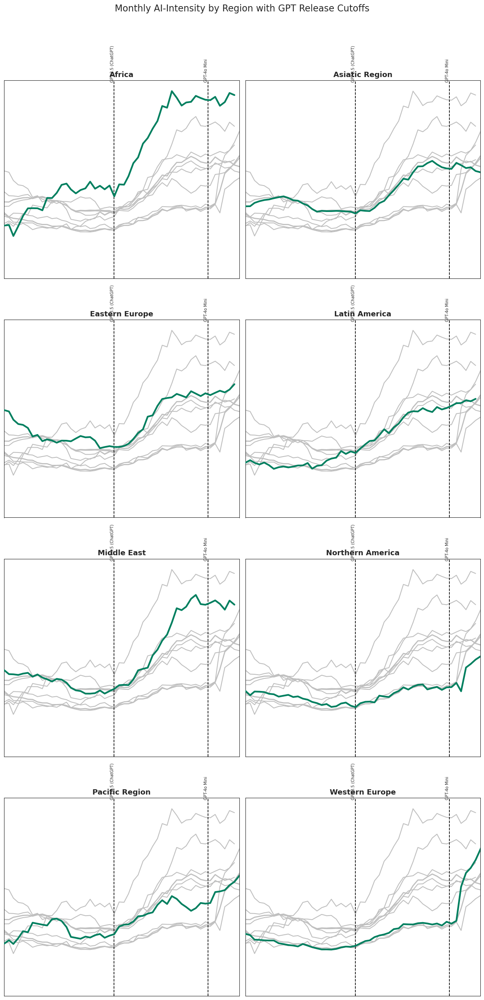

In [100]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Assume 'east', 'west', and 'region_monthly' are already defined
# and contain 'pub_month', 'smoothed', and 'Auth_Region_C' columns

# Updated GPT model releases with official names
gpt_labels = {
    pd.Timestamp('2022-11-30'): 'GPT-3.5 (ChatGPT)',
    #pd.Timestamp('2023-03-14'): 'GPT-4',
    #pd.Timestamp('2024-05-13'): 'GPT-4o',
    pd.Timestamp('2024-07-18'): 'GPT-4o Mini',
}

# Sort regions
REGIONS = sorted(region_monthly['Auth_Region_C'].unique())

# Set up 4x2 subplot grid (adjust nrows/ncols as needed)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 24), sharex=True, sharey=True)
axes = axes.flatten()

# Loop through each region
for i, region in enumerate(REGIONS):
    ax = axes[i]

    # Plot Global East & West baselines
    ax.plot(east['pub_month'], east['smoothed'], color='#BFBFBF', lw=2, label='Global East')
    ax.plot(west['pub_month'], west['smoothed'], color='#BFBFBF', lw=2, label='Global West')

    # Plot all regions in gray, highlight current in green
    for r in REGIONS:
        d = region_monthly[region_monthly['Auth_Region_C'] == r]
        x = d['pub_month']
        y = d['smoothed']
        ax.plot(x, y,
                color='#007F5F' if r == region else '#BFBFBF',
                lw=3 if r == region else 1.5,
                zorder=10 if r == region else 1)

    # Draw GPT model release cutoff lines with labels
    for cutoff, label in gpt_labels.items():
        ax.axvline(cutoff, color='black', linestyle='--', lw=1.2)
        ax.text(cutoff, 0.9605, label, rotation=90, va='bottom', ha='right', fontsize=7)

    # Axis formatting
    ax.set_xlim(pd.Timestamp('2021-01-01'), pd.Timestamp('2025-01-31'))
    ax.set_ylim(0.96, 1.01)
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(region, fontsize=13, fontweight='semibold')

# Remove unused axes if fewer than total subplots
for j in range(len(REGIONS), len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Monthly AI‐Intensity by Region with GPT Release Cutoffs", fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("AI_C_gpt_cutoffs_final.png", transparent=True, dpi=300)
plt.show()


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
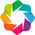

In [101]:
from collections import Counter
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
import panel as pn

hv.extension('bokeh')
pn.extension()

def create_chord(df_subset, title, filename):
    # Step 1: Extract country-to-country flows, remove N/A or 'Unknown'
    flows = []
    for _, row in df_subset.iterrows():
        source = row.get("Affiliation_Country")
        citations = row.get("Citations", [])
        if pd.isna(source) or not isinstance(citations, list):
            continue
        for citation in citations:
            target = citation.get("Citing_Affiliation_Country")
            if pd.isna(target) or target == "N/A" or source == "N/A":
                continue
            flows.append((source, target))

    flow_counts = Counter(flows)
    chord_df = pd.DataFrame([
        {"source": s, "target": t, "value": v}
        for (s, t), v in flow_counts.items()
    ])

    # Step 2: Filter valid entries and get top 20
    chord_df["value"] = pd.to_numeric(chord_df["value"], errors="coerce")
    chord_df = chord_df.dropna(subset=["source", "target", "value"])
    all_countries = pd.concat([chord_df["source"], chord_df["target"]])
    top_20 = all_countries.value_counts().head(20).index.tolist()
    chord_df = chord_df[
        chord_df["source"].isin(top_20) &
        chord_df["target"].isin(top_20)
    ]

    # Step 3: Build Chord
    countries = sorted(set(chord_df["source"]).union(chord_df["target"]))
    nodes_df = pd.DataFrame({'index': countries})
    edges_df = pd.DataFrame({
        'source': chord_df['source'],
        'target': chord_df['target'],
        'value': chord_df['value']
    })

    nodes = hv.Dataset(nodes_df, 'index')
    chord = hv.Chord((edges_df, nodes)).opts(
        opts.Chord(
            cmap='Category20',
            edge_color=dim('target'),
            node_color=dim('index'),
            labels='index',
            width=800,
            height=800,
            title=title
        )
    )

    # Step 4: Save
    pn.panel(chord).save(filename, embed=True)

# Base filter
df_base = df[
    (df["Accuracy_Prediction"] == 1) &
    (df["Citations"].notna())
].copy()

# Pre-GPT
df_pre = df_base[df_base["post_chatgpt"] == 0]
create_chord(df_pre, "Citation Flow Between Top 20 Countries (Pre-GPT)", "citation_chord_top20_pre_gpt.html")

# Post-GPT
df_post = df_base[df_base["post_chatgpt"] == 1]
create_chord(df_post, "Citation Flow Between Top 20 Countries (Post-GPT)", "citation_chord_top20_post_gpt.html")


In [102]:
def compute_rank_shift(G_pre, G_post):
    pr_pre = nx.pagerank(G_pre, weight='weight')
    pr_post = nx.pagerank(G_post, weight='weight')
    all_nodes = set(pr_pre) | set(pr_post)
    delta = {node: pr_post.get(node, 0) - pr_pre.get(node, 0) for node in all_nodes}
    return sorted(delta.items(), key=lambda x: x[1], reverse=True)

rank_shift = compute_rank_shift(G_pre, G_post)

print("Top 10 countries gaining PageRank:")
for country, shift in rank_shift[:10]:
    print(f"{country}: +{shift:.5f}")

print("\nTop 10 countries losing PageRank:")
for country, shift in rank_shift[-10:]:
    print(f"{country}: {shift:.5f}")


Top 10 countries gaining PageRank:
China: +0.03360
Indonesia: +0.00400
Saudi Arabia: +0.00211
Nigeria: +0.00209
Turkey: +0.00207
Kazakhstan: +0.00173
Jordan: +0.00171
Pakistan: +0.00160
Croatia: +0.00137
Hong Kong: +0.00120

Top 10 countries losing PageRank:
Canada: -0.00167
France: -0.00167
New Caledonia: -0.00176
Germany: -0.00196
Tajikistan: -0.00219
India: -0.00250
Peru: -0.00286
Iraq: -0.00288
Liberia: -0.00530
United States: -0.00575


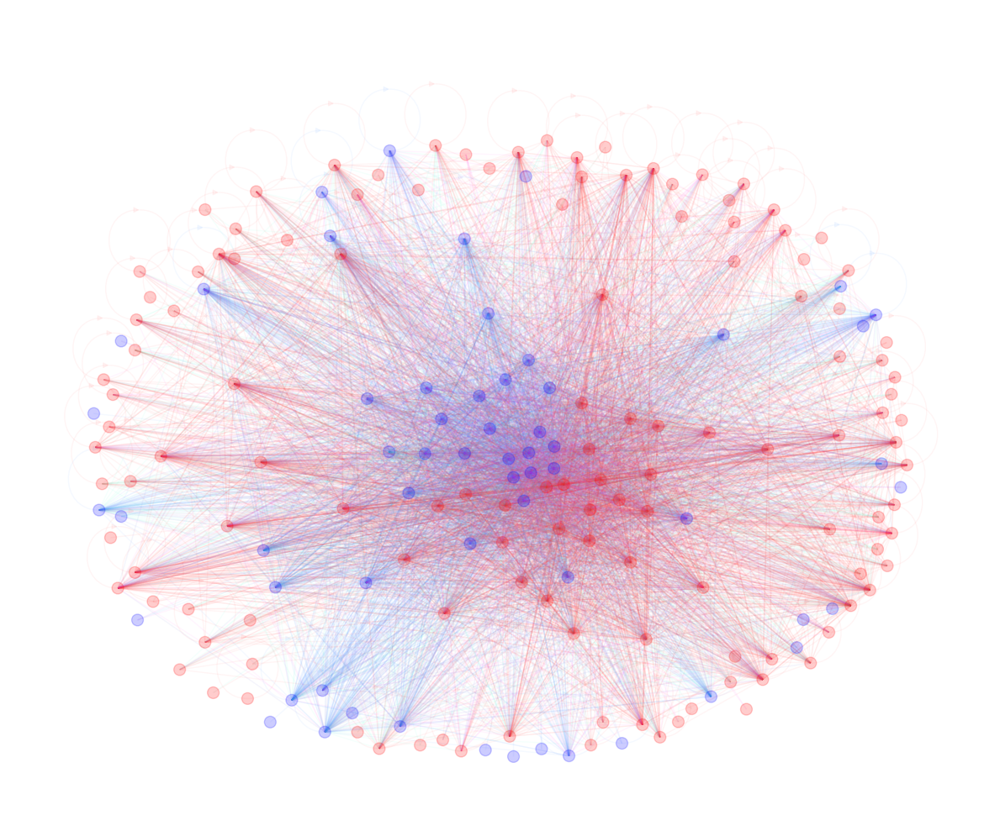

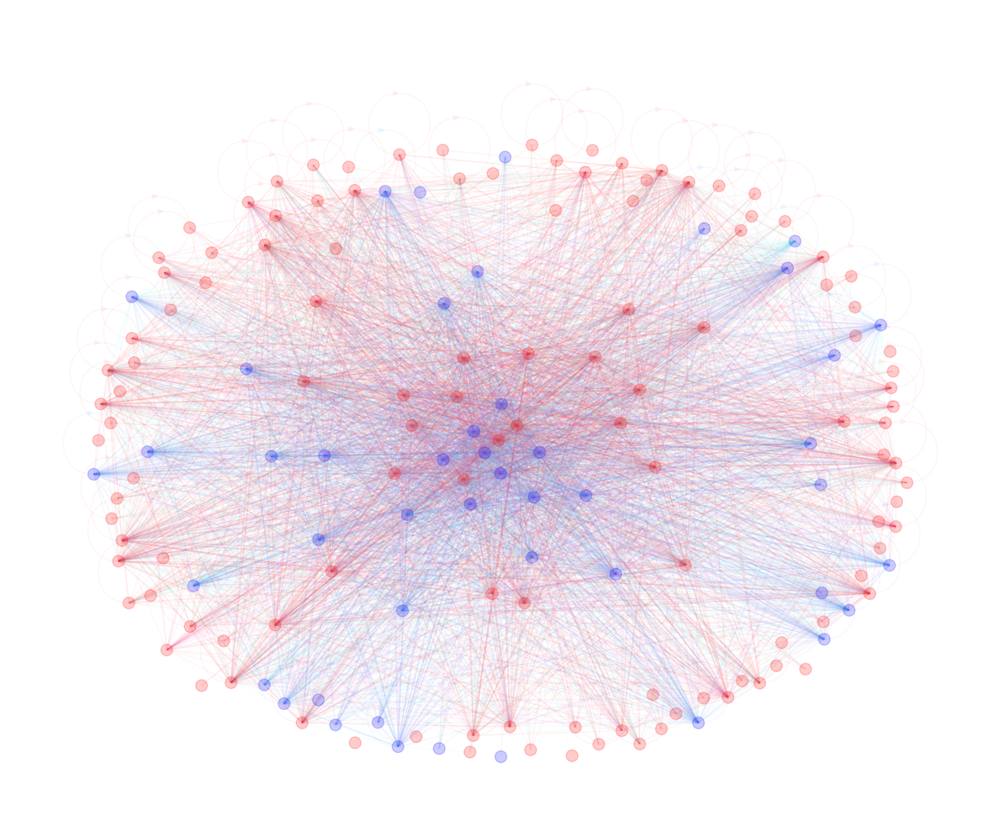

In [103]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# Assume df and global_east set are already defined
# Also assumes 'Affiliation_Country' and 'Citations' columns are available

# ───────────────────────────────────────────────
# 1. Filter Pre- and Post-GPT Article Sets
# ───────────────────────────────────────────────
df_pre_gpt = df[df['post_chatgpt'] == 0].copy()
df_post_gpt = df[df['post_chatgpt'] == 1].copy()

# ───────────────────────────────────────────────
# 2. Helper Function: Extract Country-to-Country Flows
# ───────────────────────────────────────────────
def extract_country_edges(df_subset):
    flows = []
    for _, row in df_subset.iterrows():
        source = row.get("Affiliation_Country")
        citations = row.get("Citations", [])
        if not isinstance(citations, list):
            continue
        for citation in citations:
            target = citation.get("Citing_Affiliation_Country")
            if source and target and target != "N/A":
                flows.append((source, target))
    flow_counts = Counter(flows)
    return pd.DataFrame([
        {"source": s, "target": t, "value": v}
        for (s, t), v in flow_counts.items()
    ])

# ───────────────────────────────────────────────
# 3. Generate Citation DataFrames
# ───────────────────────────────────────────────
country_net_pre_gpt = extract_country_edges(df_pre_gpt)
country_net_post_gpt = extract_country_edges(df_post_gpt)

# ───────────────────────────────────────────────
# 4. Graph Construction Function
# ───────────────────────────────────────────────
def build_graph(df_edges):
    G = nx.DiGraph()
    for _, row in df_edges.iterrows():
        src, tgt, weight = row['source'], row['target'], row['value']
        G.add_edge(src, tgt, weight=weight)
    return G

# ───────────────────────────────────────────────
# 5. Visualization Function
# ───────────────────────────────────────────────
def draw_graph(G, title, file_out):
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G, k=5, iterations=50, seed=42)

    # Node color: red (East), blue (West)
    node_colors = ['red' if node in global_east else 'blue' for node in G.nodes()]

    # Edge color: direction-sensitive glow
    def edge_color_map(s, t):
        if s in global_east and t in global_east:
            return "#FF3C3C"  # Glowing red
        elif s not in global_east and t not in global_east:
            return "#3C8DFF"  # Glowing blue
        elif s not in global_east and t in global_east:
            return "#3CFFD5"  # Cyan (West → East)
        elif s in global_east and t not in global_east:
            return "#FF3CFD"  # Magenta (East → West)
        else:
            return "#888888"

    edge_colors = [edge_color_map(s, t) for s, t in G.edges()]

    nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.2)
    nx.draw_networkx_edges(G, pos, arrows=False, edge_color=edge_colors, alpha=0.05)
    # Optional: label important countries
    # important_nodes = [n for n in G.nodes if G.degree(n) > 100]
    # nx.draw_networkx_labels(G, pos, labels={n: n for n in important_nodes}, font_size=7, font_color="white")

    plt.gca().set_facecolor("#0b0c1d")  # Deep space background
    plt.title(title, fontsize=18, color="white", pad=20)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(file_out, dpi=600, bbox_inches='tight', format='png', transparent=True)
    plt.show()

# ───────────────────────────────────────────────
# 6. Build and Visualize
# ───────────────────────────────────────────────
G_pre = build_graph(country_net_pre_gpt)
G_post = build_graph(country_net_post_gpt)

draw_graph(G_pre, "Citation Network (Pre-GPT)", "citation_pre_gpt.png")
draw_graph(G_post, "Citation Network (Post-GPT)", "citation_post_gpt.png")


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
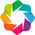

/tmp/ipykernel_2689808/871504901.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap('tab20', len(all_top))


In [105]:
from collections import Counter
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
import panel as pn
from matplotlib import cm

hv.extension('bokeh')
pn.extension()

# === Precompute consistent color mapping ===
df_base = df[
    (df["Accuracy_Prediction"] == 1) &
    (df["Citations"].notna())
].copy()

df_pre = df_base[df_base["post_chatgpt"] == 0]
df_post = df_base[df_base["post_chatgpt"] == 1]

def get_top_countries(df_subset):
    flows = []
    for _, row in df_subset.iterrows():
        src = row.get("Affiliation_Country")
        if pd.isna(src): continue
        for cit in row.get("Citations", []):
            tgt = cit.get("Citing_Affiliation_Country")
            if pd.isna(tgt) or tgt == "N/A": continue
            flows.append((src, tgt))
    cnt = Counter(flows)
    chord_df = pd.DataFrame([{"source": s, "target": t, "value": v}
                              for (s, t), v in cnt.items()])
    chord_df["value"] = pd.to_numeric(chord_df["value"], errors="coerce")
    chord_df = chord_df.dropna(subset=["source", "target", "value"])
    all_c = pd.concat([chord_df["source"], chord_df["target"]])
    return all_c.value_counts().head(20).index.tolist()

top_pre = get_top_countries(df_pre)
top_post = get_top_countries(df_post)
all_top = sorted(set(top_pre + top_post))

palette = cm.get_cmap('tab20', len(all_top))
color_key = {
    country: "#{:02x}{:02x}{:02x}".format(
        int(255*palette(i)[0]),
        int(255*palette(i)[1]),
        int(255*palette(i)[2])
    )
    for i, country in enumerate(all_top)
}

def create_chord(df_subset, title, filename, color_key):
    flows = []
    for _, row in df_subset.iterrows():
        src = row.get("Affiliation_Country")
        if pd.isna(src): continue
        for cit in row.get("Citations", []):
            tgt = cit.get("Citing_Affiliation_Country")
            if pd.isna(tgt) or tgt == "N/A": continue
            if src in color_key and tgt in color_key:
                flows.append((src, tgt))

    cnt = Counter(flows)
    chord_df = pd.DataFrame([{"source": s, "target": t, "value": v}
                              for (s, t), v in cnt.items()])

    nodes = sorted(set(chord_df["source"]) | set(chord_df["target"]))
    nodes_df = pd.DataFrame({'index': nodes})
    edges_df = pd.DataFrame({
        'source': chord_df['source'],
        'target': chord_df['target'],
        'value': chord_df['value']
    })

    ds = hv.Dataset(nodes_df, 'index')
    chord = hv.Chord((edges_df, ds)).opts(
        opts.Chord(
            labels='index',
            node_color=dim('index').categorize(color_key),
            edge_color=dim('target').categorize(color_key),
            cmap=list(color_key.values()),
            width=800,
            height=800,
            title=title
        )
    )

    pn.panel(chord).save(filename, embed=True)

create_chord(df_pre, "Citation Flow (Pre-GPT)", "citation_chord_pre.html", color_key)
create_chord(df_post, "Citation Flow (Post-GPT)", "citation_chord_post.html", color_key)
